
<div class="alert" style="background-color:#fff; color:white; padding:0px 10px; border-radius:5px;"><h1 style="margin:15px 15px; color:#006a79; font-size:40px; text-align:center">Retail Sales Forecast</h1></div><p style="text-align:center">Copyright (©)  Vengatesan-K. All Rights Reserved.</p>

 ***

## $\color{#006a79}{\text{Context}}$ 

> The Challenge - One challenge of modeling retail data is the need to make decisions based on limited history. Holidays and select major events come once a year, and so does the chance to see how strategic decisions impacted the bottom line. In addition, markdowns are known to affect sales – the challenge is to predict which departments will be affected and to what extent.

## $\color{#006a79}{\text{Content}}$

 > You are provided with historical sales data for 45 stores located in different regions - each store contains a number of departments. The company also runs several promotional markdown events throughout the year. These markdowns precede prominent holidays, the four largest of which are the Super Bowl, Labor Day, Thanksgiving, and Christmas. The weeks including these holidays are weighted five times higher in the evaluation than non-holiday weeks.
  Within the Excel Sheet, there are 3 Tabs – Stores, Features and Sales

### $\color{#006a79}{\text{Stores}}$

 <div class="alert alert-block alert-info">
<b></b> Anonymized information about the 45 stores, indicating the type and size of store.
</div>

`Store - the store number`

`Type - product category`

`Size - Store Area`

### $\color{#006a79}{\text{Features}}$

<div class="alert alert-block alert-success">
<b>Metadata :</b> Contains additional data related to the store, department, and regional activity for the given dates.
</div>

 `Store - the store number`
 
 `Date - the week` 
 
 `Temperature - average temperature in the region`
 
 `Fuel_Price - cost of fuel in the region`
 
 `MarkDown1-5 - anonymized data related to promotional markdowns. MarkDown data is only available after Nov 2011, and is not available for all stores all the time. Any missing value is marked with an NA`
 
 `CPI - the consumer price index`
 
`Unemployment - the unemployment rate`

`IsHoliday - whether the week is a special holiday week`

### $\color{#006a79}{\text{Sales}}$

 <div class="alert alert-block alert-info">
<b> </b> Historical sales data, which covers to 2010-02-05 to 2012-11-01. Within this tab you will find the following fields :
</div>

 `Store - the store number`
 
`Dept - the department number`

`Date - the week`

`Weekly_Sales -  sales for the given department in the given store`

`IsHoliday - whether the week is a special holiday week`

## $\color{#006a79}{\text{Mission}}$

 - Predict the department-wide sales for each store for the following year
- Model the effects of markdowns on holiday weeks
- Provide recommended actions based on the insights drawn, with prioritization placed on largest business impact

In [2]:
import os
os.environ['JAVA_HOME']='C:\\Program Files\\Eclipse Adoptium\\jdk-21.0.0.35-hotspot\\'

In [3]:
import findspark
findspark.init()

In [4]:
os.environ['SPARK_HOME']

'C:\\Users\\VENKA\\anaconda3\\lib\\site-packages\\pyspark'

In [5]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()

In [6]:
from pyspark.sql import SparkSession
from pyspark import SparkConf
spark = SparkSession.builder \
    .appName("My PySpark Application") \
    .master("local[*]") \
    .getOrCreate()

In [7]:
spark

In [8]:
spark.sparkContext

<SparkContext master=local[*] appName=pyspark-shell>

<br>  $\color{#006a79}{\text{Index}}$  :
* [Reading files to merge](#1)
* [Join the datasets](#2)
* [Analysis Storewise](#3)
* [Analysis Departmentwise](#4)
* [Analysis Store Type and Year/Month Wise](#5) 
* [Analysis of MarkDown](#6)
* [Prediction on Date and Store](#7)

<a id="1"></a> <br>
# **Reading files to merge**

### __[ Click for Dataset](https://drive.google.com/drive/folders/1-DX3a7-jraKDIPhJY1HNBSt5E4sA5hmb)__

In [8]:
import pandas as pd

feature = 'https://raw.githubusercontent.com/Vengatesan-K/Retail-sales-forecast/main/Data%20compilation/Features_data_set.csv'

pd_df = pd.read_csv(feature)
feature_df = spark.createDataFrame(pd_df)

feature_df.limit(10).show()

+-----+----------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+---------+
|Store|      Date|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|IsHoliday|
+-----+----------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+---------+
|    1|05/02/2010|      42.31|     2.572|      NaN|      NaN|      NaN|      NaN|      NaN|211.0963582|       8.106|    false|
|    1|12/02/2010|      38.51|     2.548|      NaN|      NaN|      NaN|      NaN|      NaN|211.2421698|       8.106|     true|
|    1|19/02/2010|      39.93|     2.514|      NaN|      NaN|      NaN|      NaN|      NaN|211.2891429|       8.106|    false|
|    1|26/02/2010|      46.63|     2.561|      NaN|      NaN|      NaN|      NaN|      NaN|211.3196429|       8.106|    false|
|    1|05/03/2010|       46.5|     2.625|      NaN|      NaN|      NaN|      NaN|      NaN|211.3501429|       8

In [98]:
sales = 'https://raw.githubusercontent.com/Vengatesan-K/Retail-sales-forecast/main/Data%20compilation/sales_data_set.csv'

sa_df = pd.read_csv(sales)
sales_df = spark.createDataFrame(sa_df)

sales_df.limit(10).show()

+-----+----+----------+------------+---------+
|Store|Dept|      Date|Weekly_Sales|IsHoliday|
+-----+----+----------+------------+---------+
|    1|   1|05/02/2010|     24924.5|    false|
|    1|   1|12/02/2010|    46039.49|     true|
|    1|   1|19/02/2010|    41595.55|    false|
|    1|   1|26/02/2010|    19403.54|    false|
|    1|   1|05/03/2010|     21827.9|    false|
|    1|   1|12/03/2010|    21043.39|    false|
|    1|   1|19/03/2010|    22136.64|    false|
|    1|   1|26/03/2010|    26229.21|    false|
|    1|   1|02/04/2010|    57258.43|    false|
|    1|   1|09/04/2010|    42960.91|    false|
+-----+----+----------+------------+---------+



In [99]:
stores = 'https://raw.githubusercontent.com/Vengatesan-K/Retail-sales-forecast/main/Data%20compilation/stores_data_set.csv'

st_df = pd.read_csv(stores)
stores_df = spark.createDataFrame(st_df)

stores_df.limit(10).show()

+-----+----+------+
|Store|Type|  Size|
+-----+----+------+
|    1|   A|151315|
|    2|   A|202307|
|    3|   B| 37392|
|    4|   A|205863|
|    5|   B| 34875|
|    6|   A|202505|
|    7|   B| 70713|
|    8|   A|155078|
|    9|   B|125833|
|   10|   B|126512|
+-----+----+------+



<a id="2"></a> <br>
# **Join the datasets**

> One of the most essential operations in data processing is joining datasets, which enables you to combine data from different sources based on a common key.

> A left join returns all rows from the left dataframe and the matched rows from the right dataframe. If no match is found for a key in the right dataframe, the result will contain null values.

In [100]:
retail_df = sales_df.join(feature_df, on=['Store', 'Date', 'IsHoliday'], how='left') # First left join

retail_df = retail_df.join(stores_df, on=['Store'], how='left') # Second left join

retail_df.show()

+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|Store|      Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|
+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|    1|12/03/2010|    false|   1|    21043.39|      57.79|     2.667|      NaN|      NaN|      NaN|      NaN|      NaN|211.3806429|       8.106|   A|151315|
|    1|11/06/2010|    false|   1|    16637.62|      80.43|     2.668|      NaN|      NaN|      NaN|      NaN|      NaN|211.4560951|       7.808|   A|151315|
|    1|05/02/2010|    false|   1|     24924.5|      42.31|     2.572|      NaN|      NaN|      NaN|      NaN|      NaN|211.0963582|       8.106|   A|151315|
|    1|26/03/2010|    false|   1|    26229.21|      51.45|

In [106]:
retail_df.toPandas().to_csv('retail_pys.csv')

### Reading and Writing CSV Files

In [9]:
retail_df = 'C:/Users/VENKA/Desktop/Data Science/Python Anaconda/retail_pys.csv'
retail_df = spark.read.csv(retail_df, header=True, inferSchema=True)

In [71]:
retail_df.show(5)

+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|Store|      Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|
+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|    1|05-02-2010|    false|   1|     24924.5|      42.31|     2.572|     NULL|     NULL|     NULL|     NULL|     NULL|211.0963582|       8.106|   A|151315|
|    1|05-02-2010|    false|   2|    50605.27|      42.31|     2.572|     NULL|     NULL|     NULL|     NULL|     NULL|211.0963582|       8.106|   A|151315|
|    1|05-02-2010|    false|   3|    13740.12|      42.31|     2.572|     NULL|     NULL|     NULL|     NULL|     NULL|211.0963582|       8.106|   A|151315|
|    1|05-02-2010|    false|   4|    39954.04|      42.31|

In [56]:
type(retail_df)

pyspark.sql.dataframe.DataFrame

In [57]:
column_count = len(retail_df.columns)

num_rows = retail_df.count()
num_columns = column_count

column_list = retail_df.columns

print(f"Dataset Columns: {column_count}\nShape: ({num_rows} rows, {num_columns} columns)\nColumns: {', '.join(column_list)}")

Dataset Columns: 16
Shape: (421570 rows, 16 columns)
Columns: Store, Date, IsHoliday, Dept, Weekly_Sales, Temperature, Fuel_Price, MarkDown1, MarkDown2, MarkDown3, MarkDown4, MarkDown5, CPI, Unemployment, Type, Size


### Missing Values

In [58]:
from pyspark.sql.functions import col, sum

missing_data = retail_df.select([sum(col(c).isNull().cast("int")).alias(c) for c in retail_df.columns])
missing_data.show()

+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+---+------------+----+----+
|Store|Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|CPI|Unemployment|Type|Size|
+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+---+------------+----+----+
|    0|   0|        0|   0|           0|          0|         0|   270889|   310322|   284479|   286603|   270138|  0|           0|   0|   0|
+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+---+------------+----+----+



In [17]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

<Axes: >

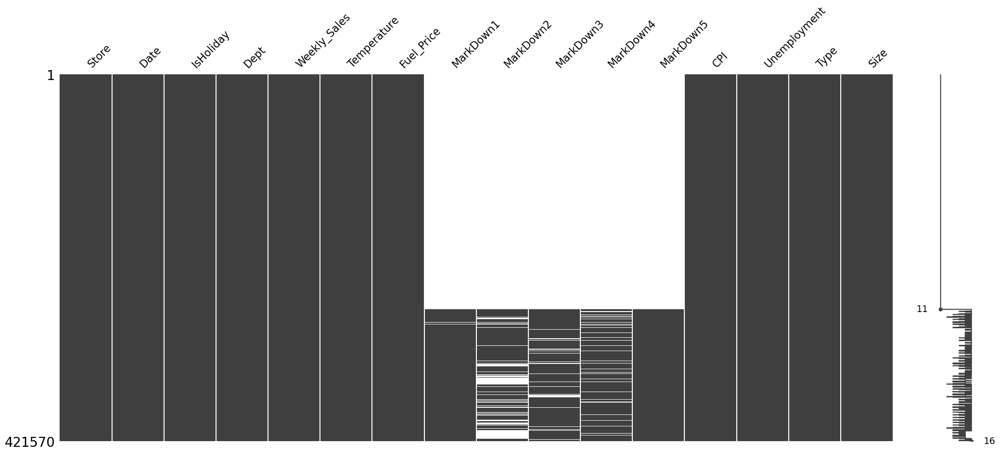

In [14]:
import missingno as msno
pandas_df = retail_df.toPandas()
msno.matrix(pandas_df)

In [28]:
retail_df.select(['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']).show(20)

+---------+---------+---------+---------+---------+
|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|
+---------+---------+---------+---------+---------+
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL|     NULL|     NULL|     NULL|     NULL|
|     NULL| 

### Data type transformation

In [84]:
retail_df.printSchema()  # Display the schema
row_count = retail_df.count()  # Get the number of rows
num_columns = len(retail_df.columns)  # Get the number of columns

print("Number of Rows: ", row_count)
print("Number of Columns: ", num_columns)

root
 |-- Store: long (nullable = true)
 |-- Date: timestamp (nullable = true)
 |-- IsHoliday: boolean (nullable = true)
 |-- Dept: long (nullable = true)
 |-- Weekly_Sales: double (nullable = true)
 |-- Temperature: double (nullable = true)
 |-- Fuel_Price: double (nullable = true)
 |-- MarkDown1: double (nullable = true)
 |-- MarkDown2: double (nullable = true)
 |-- MarkDown3: double (nullable = true)
 |-- MarkDown4: double (nullable = true)
 |-- MarkDown5: double (nullable = true)
 |-- CPI: double (nullable = true)
 |-- Unemployment: double (nullable = true)
 |-- Type: string (nullable = true)
 |-- Size: long (nullable = true)

Number of Rows:  421570
Number of Columns:  16


#### Data-types
print'(retail_df.dtypes)'

  <div class="alert alert-block alert-danger">
<b>Info:</b> In PySpark, "Double" refers to a data type used to represent floating-point numbers with double precision. A double-precision floating-point number, often referred to as a "double," is a numerical data type used to represent decimal numbers with a high level of precision. and the term "nullable" is used in the context of defining the nullability of columns in a DataFrame or a schema. It specifies whether a column can have null (missing or absent) values or not.
</div>

In [73]:
pandas_df = retail_df.toPandas()
#pandas_df.describe()

In [82]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   Store         421570 non-null  int32         
 1   Date          421570 non-null  datetime64[ns]
 2   IsHoliday     421570 non-null  bool          
 3   Dept          421570 non-null  int32         
 4   Weekly_Sales  421570 non-null  float64       
 5   Temperature   421570 non-null  float64       
 6   Fuel_Price    421570 non-null  float64       
 7   MarkDown1     150681 non-null  float64       
 8   MarkDown2     111248 non-null  float64       
 9   MarkDown3     137091 non-null  float64       
 10  MarkDown4     134967 non-null  float64       
 11  MarkDown5     151432 non-null  float64       
 12  CPI           421570 non-null  float64       
 13  Unemployment  421570 non-null  float64       
 14  Type          421570 non-null  object        
 15  Size          421

In [81]:
import pandas as pd
pandas_df['Date'] = pd.to_datetime(pandas_df['Date'])

In [83]:
retail_df = spark.createDataFrame(pandas_df)

In [86]:
from pyspark.sql.functions import to_date

retail_df = retail_df.withColumn('Date', to_date(retail_df['Date'], 'MM-dd-yyyy'))

In [70]:
spark.conf.set("spark.sql.legacy.timeParserPolicy","EXCEPTION")

In [147]:
import pyspark.sql.functions as F
retail_df = retail_df.withColumn("Date",F.date_format("Date",format="dd-MM-yyyy"))

In [61]:
retail_df.select(["Date"]).show(10)

+-------------------+
|               Date|
+-------------------+
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
|2010-05-02 00:00:00|
+-------------------+
only showing top 10 rows



In [88]:
retail_df.dtypes

[('Store', 'bigint'),
 ('Date', 'date'),
 ('IsHoliday', 'boolean'),
 ('Dept', 'bigint'),
 ('Weekly_Sales', 'double'),
 ('Temperature', 'double'),
 ('Fuel_Price', 'double'),
 ('MarkDown1', 'double'),
 ('MarkDown2', 'double'),
 ('MarkDown3', 'double'),
 ('MarkDown4', 'double'),
 ('MarkDown5', 'double'),
 ('CPI', 'double'),
 ('Unemployment', 'double'),
 ('Type', 'string'),
 ('Size', 'bigint')]

In [91]:
import os
import sys

os.environ['PYSPARK_PYTHON'] = sys.executable
os.environ['PYSPARK_DRIVER_PYTHON'] = sys.executable

In [87]:
retail_df.show()

+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|Store|      Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|
+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|    1|2010-05-02|    false|   1|     24924.5|      42.31|     2.572|      NaN|      NaN|      NaN|      NaN|      NaN|211.0963582|       8.106|   A|151315|
|    1|2010-05-02|    false|   2|    50605.27|      42.31|     2.572|      NaN|      NaN|      NaN|      NaN|      NaN|211.0963582|       8.106|   A|151315|
|    1|2010-05-02|    false|   3|    13740.12|      42.31|     2.572|      NaN|      NaN|      NaN|      NaN|      NaN|211.0963582|       8.106|   A|151315|
|    1|2010-05-02|    false|   4|    39954.04|      42.31|

#### Unique - Values

In [17]:
duplicate_rows = retail_df.groupBy(retail_df.columns).count().where("count > 1").drop("count")

duplicate_rows.show()

+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+---+------------+----+----+
|Store|Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|CPI|Unemployment|Type|Size|
+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+---+------------+----+----+
+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+---+------------+----+----+



In [18]:
from pyspark.sql import functions as F

cols = ["Store", "Date", "IsHoliday", "Dept", "Weekly_Sales", "Temperature", "Fuel_Price", "MarkDown1", "MarkDown2", "MarkDown3", "MarkDown4", "MarkDown5", "CPI", "Unemployment", "Type", "Size"]

counts_df = retail_df.select([
    F.countDistinct(*cols).alias('n_unique'),
    F.count('*').alias('n_rows')
])
n_unique, n_rows = counts_df.collect()[0]

In [19]:
counts_df.show()

+--------+------+
|n_unique|n_rows|
+--------+------+
|       0|421570|
+--------+------+



In [119]:
column_names = retail_df.columns

unique_counts = {}

for column_name in column_names:
    unique_values_df = retail_df.select(column_name).distinct()
    unique_count = unique_values_df.count()
    unique_counts[column_name] = unique_count

for column, count in unique_counts.items():
    print(f"Number of unique values in '{column}': {count}")

Number of unique values in 'Store': 45
Number of unique values in 'Date': 143
Number of unique values in 'IsHoliday': 2
Number of unique values in 'Dept': 81
Number of unique values in 'Weekly_Sales': 359464
Number of unique values in 'Temperature': 3528
Number of unique values in 'Fuel_Price': 892
Number of unique values in 'MarkDown1': 2278
Number of unique values in 'MarkDown2': 1500
Number of unique values in 'MarkDown3': 1663
Number of unique values in 'MarkDown4': 1945
Number of unique values in 'MarkDown5': 2294
Number of unique values in 'CPI': 2145
Number of unique values in 'Unemployment': 349
Number of unique values in 'Type': 3
Number of unique values in 'Size': 40


In [ ]:
import pyspark.sql.functions as f
retail_df.join(
    retail_df.groupBy(retail_df.columns).agg((f.count("*")>1).cast("int").alias("Duplicate_indicator")),
    on=retail_df.columns,
    how="inner"
).show()

In [37]:
import pyspark.sql.functions as F
from pyspark.sql.window import Window

window_spec = Window.partitionBy(retail_df.columns).orderBy(F.lit(1))

retail_df = retail_df.withColumn("Duplicate_indicator", F.row_number().over(window_spec) > 1)

retail_df.show()

duplicate_count = retail_df.filter(F.col("Duplicate_indicator") == 1).count()

print("Total Duplicate Rows:", duplicate_count)

+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+-------------------+
|Store|Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|Duplicate_indicator|
+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+-------------------+
|    1|NULL|    false|   1|    14978.09|      86.41|     3.637|     NULL|     NULL|     NULL|     NULL|     NULL|214.9980596|       7.682|   A|151315|              false|
|    1|NULL|    false|   1|     16286.4|      77.66|      3.62|  6237.83|   260.06|     2.97|  3463.03|  7988.25|222.1719457|       6.908|   A|151315|              false|
|    1|NULL|    false|   1|    17558.82|      79.35|     3.393|  5621.99|    109.6|     0.25|  2420.28|  3083.26|221.7626421|       7.143|   A|15

In [31]:
selected_columns = ["Store", "Date", "IsHoliday", "Dept", "Weekly_Sales", "Temperature", "Fuel_Price", "MarkDown1"]
selected_columns_df = retail_df.select(selected_columns)

selected_columns_df.describe().show()

+-------+------------------+----------+------------------+------------------+------------------+-------------------+-----------------+
|summary|             Store|      Date|              Dept|      Weekly_Sales|       Temperature|         Fuel_Price|        MarkDown1|
+-------+------------------+----------+------------------+------------------+------------------+-------------------+-----------------+
|  count|            421570|    421570|            421570|            421570|            421570|             421570|           150681|
|   mean|22.200545579619043|      NULL| 44.26031738501317|15981.258123467172| 60.09005873283154| 3.3610265270299013|7246.420195910487|
| stddev|12.785297389902983|      NULL|30.492054015785914| 22711.18351916316|18.447931147615908|0.45851453712775286|8291.221345474862|
|    min|                 1|01-04-2011|                 1|          -4988.94|             -2.06|              2.472|             0.27|
|    max|                45|31-12-2010|                

In [32]:
selected_columns1 = ["MarkDown2", "MarkDown3", "MarkDown4", "MarkDown5", "CPI", "Unemployment", "Type", "Size"]
selected_columns_df1 = retail_df.select(selected_columns1)

selected_columns_df1.describe().show()

+-------+------------------+------------------+-----------------+-----------------+------------------+------------------+------+------------------+
|summary|         MarkDown2|         MarkDown3|        MarkDown4|        MarkDown5|               CPI|      Unemployment|  Type|              Size|
+-------+------------------+------------------+-----------------+-----------------+------------------+------------------+------+------------------+
|  count|            111248|            137091|           134967|           151432|            421570|            421570|421570|            421570|
|   mean|3334.6286210987205|1439.4213841900887|3383.168256092236|4628.975079177681|171.20194682297077|7.9602886946411875|  NULL|136727.91573878596|
| stddev|  9475.35732545808| 9623.078290312753|6292.384030869944|5962.887455254661| 39.15927562301233|1.8632960384301769|  NULL| 60980.58332810141|
|    min|           -265.76|             -29.1|             0.22|           135.16|           126.064|          

In [ ]:
pandas_df = retail_df.toPandas()

In [63]:
#spark.stop()

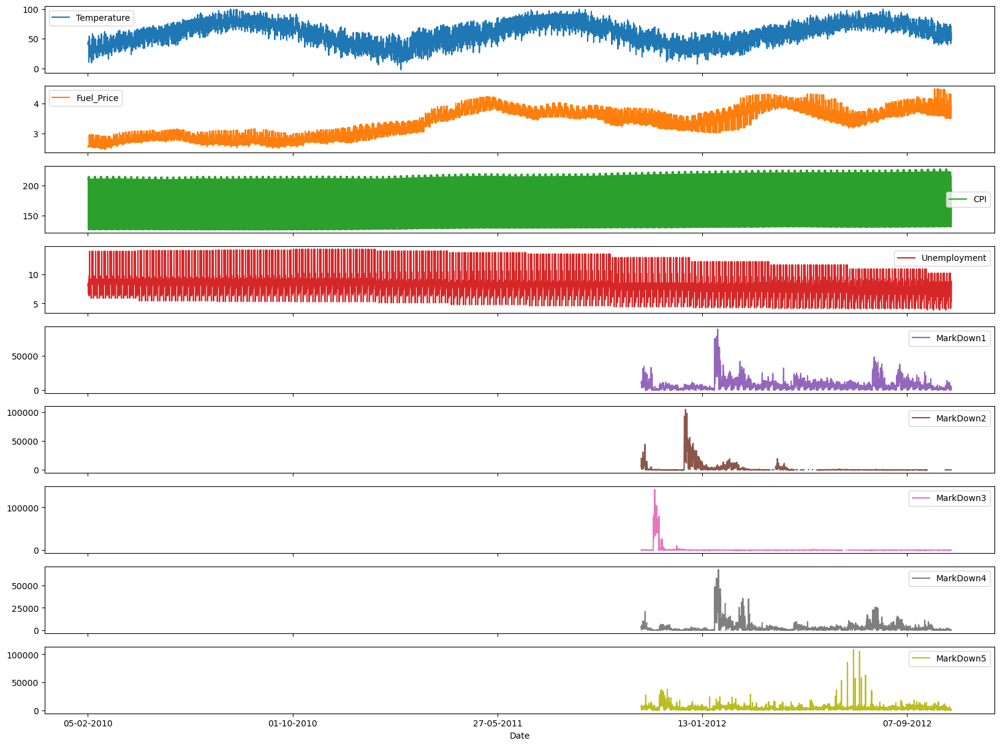

In [22]:
pandas_df[['Date', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 
    'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']].plot(x='Date', subplots=True, figsize=(20,15))
plt.show()

In [38]:
retail_df.show(5)

+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+-------------------+
|Store|Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|Duplicate_indicator|
+-----+----+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+-------------------+
|    1|NULL|    false|   1|    14978.09|      86.41|     3.637|     NULL|     NULL|     NULL|     NULL|     NULL|214.9980596|       7.682|   A|151315|              false|
|    1|NULL|    false|   1|     16286.4|      77.66|      3.62|  6237.83|   260.06|     2.97|  3463.03|  7988.25|222.1719457|       6.908|   A|151315|              false|
|    1|NULL|    false|   1|    17558.82|      79.35|     3.393|  5621.99|    109.6|     0.25|  2420.28|  3083.26|221.7626421|       7.143|   A|15

In [54]:
retail_df = retail_df.drop("Duplicate_indicator")

In [89]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col


column_types = [f"{col}: {dtype}" for col, dtype in retail_df.dtypes]

summary_rows = []

summary_rows.append(["column Type"] + column_types)

null_counts = [retail_df.filter(col(c).isNull()).count() for c in retail_df.columns]
summary_rows.append(["null values (nb)"] + null_counts)

total_rows = retail_df.count()
null_percentages = [(count / total_rows * 100) for count in null_counts]
summary_rows.append(["null values (%)"] + null_percentages)

tab_info = spark.createDataFrame(summary_rows, ["Statistic"] + retail_df.columns)

tab_info.show()

+----------------+-------------+----------+------------------+------------+--------------------+-------------------+------------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------+--------------------+------------+------------+
|       Statistic|        Store|      Date|         IsHoliday|        Dept|        Weekly_Sales|        Temperature|        Fuel_Price|        MarkDown1|        MarkDown2|        MarkDown3|        MarkDown4|        MarkDown5|        CPI|        Unemployment|        Type|        Size|
+----------------+-------------+----------+------------------+------------+--------------------+-------------------+------------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------+--------------------+------------+------------+
|     column Type|Store: bigint|Date: date|IsHoliday: boolean|Dept: bigint|Weekly_Sales: double|Temperature: double|Fuel_Price: double|MarkDown1:

In [90]:
columns_with_missing_values = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Fill missing values with zeros for the specified columns
for column in columns_with_missing_values:
    retail_df = retail_df.fillna(0, subset=[column])

retail_df.show()

+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|Store|      Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|
+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|    1|2010-05-02|    false|   1|     24924.5|      42.31|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|211.0963582|       8.106|   A|151315|
|    1|2010-05-02|    false|   2|    50605.27|      42.31|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|211.0963582|       8.106|   A|151315|
|    1|2010-05-02|    false|   3|    13740.12|      42.31|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|211.0963582|       8.106|   A|151315|
|    1|2010-05-02|    false|   4|    39954.04|      42.31|

In [19]:
columns_to_print = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Print unique values for each column
for column_name in columns_to_print:
    unique_values = retail_df.select(column_name).distinct().collect()
    unique_values = [row[column_name] for row in unique_values]
    
    print(f"Unique values for {column_name}: {unique_values}")

Unique values for MarkDown1: [0.0, 10382.9, 16308.11, 48.84, 4971.01, 1649.31, 6839.45, 149.19, 27.61, 1383.53, 8787.59, 3378.96, 531.09, 5957.36, 1100.08, 13444.17, 5590.39, 9134.39, 1282.42, 7021.01, 32.13, 7174.09, 5522.33, 429.03, 23052.25, 6165.27, 25.73, 362.32, 3668.4, 23654.62, 10941.05, 16544.63, 310.16, 10710.56, 4817.96, 2232.08, 10860.98, 174.72, 9157.72, 107.42, 65.32, 861.43, 1328.35, 748.82, 4673.94, 4649.8, 4240.34, 5223.35, 561.45, 679.88, 90.28, 105.63, 2513.13, 9025.52, 437.61, 11376.03, 3307.6, 179.25, 3235.06, 6490.92, 27064.58, 32812.24, 8894.84, 6772.46, 21104.84, 3935.0, 10100.14, 919.71, 12590.41, 410.31, 6756.03, 70.24, 86.59, 6074.12, 5.64, 286.52, 122.33, 4971.23, 11003.75, 17118.58, 2571.98, 8864.34, 8394.65, 233.85, 952.21, 3221.47, 32.17, 9391.17, 335.66, 10797.64, 5042.4, 42.28, 2544.26, 121.57, 2971.48, 15992.53, 7642.65, 3648.4, 2089.46, 34348.14, 31400.97, 4539.94, 12851.52, 5391.83, 12691.27, 10215.77, 9727.57, 3761.33, 22242.79, 3886.23, 35.94, 2286

In [91]:
columns_to_print = ['MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5']

# Print unique values for each column in a single table
retail_df.select(*columns_to_print).distinct().show()

+---------+---------+---------+---------+---------+
|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|
+---------+---------+---------+---------+---------+
|      0.0|      0.0|      0.0|      0.0|      0.0|
|  9025.52|   794.02|   198.98|  2629.75|  5364.55|
|     32.5|   317.08| 42455.51|      6.0|  1438.09|
|   7197.6|   239.76|  9191.67|  4716.48| 28279.83|
| 23052.25|  5449.62|   189.24|  3355.69|   3864.6|
|  6772.46|  1654.68|    86.01|  1068.35|  9835.85|
|   247.58|   387.88| 40362.07|     47.0|  1788.31|
|      0.0|      0.0|      0.0|      0.0|   256.45|
| 23654.62|   110.12|   103.34|   951.51|   1618.6|
|  1333.24|      0.0| 58563.24|    20.97|  6386.86|
|  1237.88|      0.0|  1330.53|   643.78|  8323.51|
|  2359.44|      4.0|   658.01|   901.67| 24751.93|
|   3389.1|     43.0|  1258.32|   325.35|  8623.67|
|   3307.6|  1431.65|   143.06|  1330.31|   1680.9|
|   310.16|   181.17| 62095.85|   106.24|   1292.3|
|  6264.18|    74.94|  2885.14|  3904.82| 27272.53|
|   233.85| 

In [92]:
retail_df.printSchema()  # Display the schema
row_count = retail_df.count()  # Get the number of rows
num_columns = len(retail_df.columns)  # Get the number of columns

print("Number of Rows: ", row_count)
print("Number of Columns: ", num_columns)

root
 |-- Store: long (nullable = true)
 |-- Date: date (nullable = true)
 |-- IsHoliday: boolean (nullable = true)
 |-- Dept: long (nullable = true)
 |-- Weekly_Sales: double (nullable = true)
 |-- Temperature: double (nullable = true)
 |-- Fuel_Price: double (nullable = true)
 |-- MarkDown1: double (nullable = false)
 |-- MarkDown2: double (nullable = false)
 |-- MarkDown3: double (nullable = false)
 |-- MarkDown4: double (nullable = false)
 |-- MarkDown5: double (nullable = false)
 |-- CPI: double (nullable = true)
 |-- Unemployment: double (nullable = true)
 |-- Type: string (nullable = true)
 |-- Size: long (nullable = true)

Number of Rows:  421570
Number of Columns:  16


In [94]:
retail_df.toPandas().to_csv('retail_pysk.csv')

In [102]:
retail_df = 'C:/Users/VENKA/Desktop/Data Science/Python Anaconda/retail_pysk.csv'
retail_df = spark.read.csv(retail_df, header=True, inferSchema=True)

In [103]:
retail_df.show()

+---+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|_c0|Store|      Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|
+---+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
|  0|    1|2010-05-02|    false|   1|     24924.5|      42.31|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|211.0963582|       8.106|   A|151315|
|  1|    1|2010-05-02|    false|   2|    50605.27|      42.31|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|211.0963582|       8.106|   A|151315|
|  2|    1|2010-05-02|    false|   3|    13740.12|      42.31|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|211.0963582|       8.106|   A|151315|
|  3|    1|2010-05-02|    false|  

In [97]:
retail_df.filter("Weekly_Sales<=0").show()

+----+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
| _c0|Store|      Date|IsHoliday|Dept|Weekly_Sales|Temperature|Fuel_Price|MarkDown1|MarkDown2|MarkDown3|MarkDown4|MarkDown5|        CPI|Unemployment|Type|  Size|
+----+-----+----------+---------+----+------------+-----------+----------+---------+---------+---------+---------+---------+-----------+------------+----+------+
| 389|    6|2010-05-02|    false|  47|       -59.0|      40.43|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|212.6223518|       7.259|   A|202505|
| 601|    9|2010-05-02|    false|  49|       -15.0|      38.01|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|214.6554591|       6.415|   B|125833|
| 714|   11|2010-05-02|    false|  19|         0.0|      46.04|     2.572|      0.0|      0.0|      0.0|      0.0|      0.0|214.4248812|       7.368|   A|207499|
|1039|   15|2010-05-02|    f

In [98]:
retail_df.groupBy('Store').avg().show(45)

+-----+------------------+----------+------------------+------------------+------------------+------------------+------------------+------------------+-------------------+------------------+------------------+------------------+------------------+---------+
|Store|          avg(_c0)|avg(Store)|         avg(Dept)| avg(Weekly_Sales)|  avg(Temperature)|   avg(Fuel_Price)|    avg(MarkDown1)|    avg(MarkDown2)|     avg(MarkDown3)|    avg(MarkDown4)|    avg(MarkDown5)|          avg(CPI)| avg(Unemployment)|avg(Size)|
+-----+------------------+----------+------------------+------------------+------------------+------------------+------------------+------------------+-------------------+------------------+------------------+------------------+------------------+---------+
|   31|210591.94705186354|      31.0| 44.55107473871031|19681.907464011045| 68.82848451981856|  3.21895030565964|3436.9742466969055| 738.0380447643456|  329.0707345691219|1225.4432478801016|2748.1039361072817|215.6388062001581

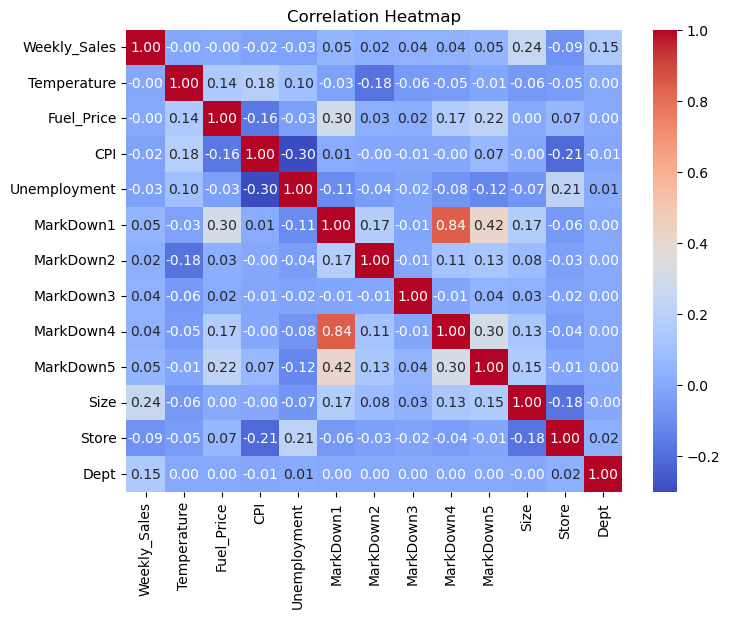

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import corr

#numerical_columns = [col for col in retail_df.columns if retail_df.schema[col].dataType.simpleString() in ('double', 'float', 'int')]
selected_columns = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5','Size','Store','Dept']
# Create an empty correlation matrix
correlation_matrix = []

# Calculate correlations for each pair of numerical columns
for col1 in selected_columns:
    row = []
    for col2 in selected_columns:
        correlation = retail_df.select(corr(col1, col2)).collect()[0][0]
        row.append(correlation)
    correlation_matrix.append(row)

# Convert the correlation matrix to a Pandas DataFrame
import pandas as pd
correlation_df = pd.DataFrame(correlation_matrix, columns=selected_columns, index=selected_columns)

# Create a correlation heatmap using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_df, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

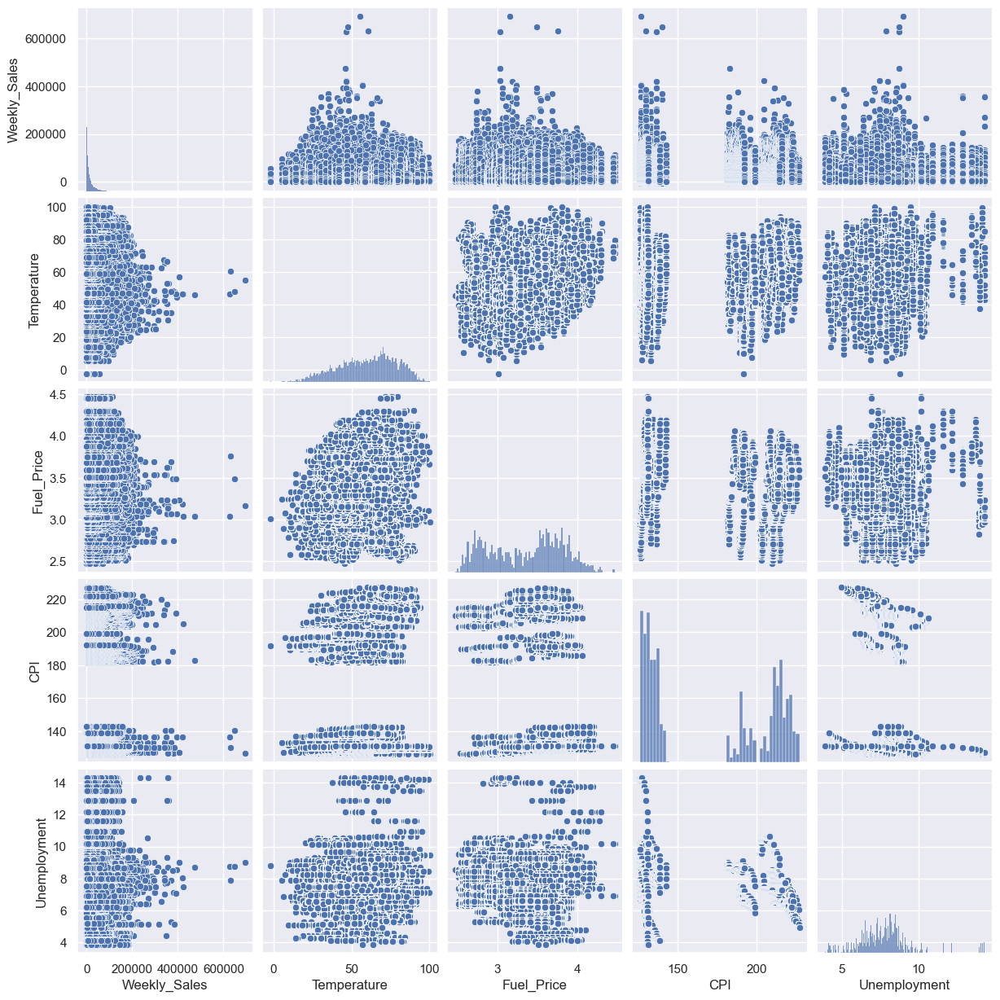

In [22]:
cols = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
pairp_df = retail_df.select(cols).toPandas()
sns.set()
sns.pairplot(pairp_df, height=2.5)
plt.show()

In [127]:
import plotly.io as pio
pio.renderers

Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']

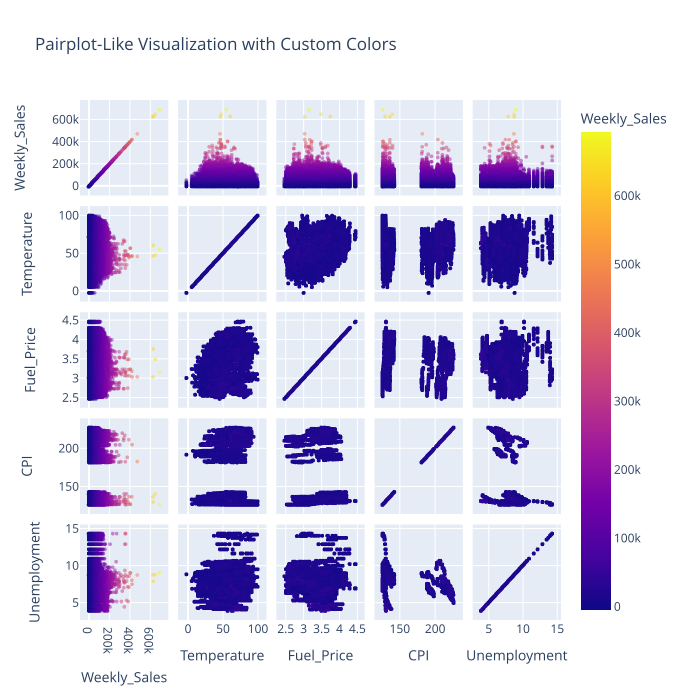

In [128]:
import plotly.express as px
import pandas as pd

cols = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
pairp_df = retail_df.select(cols).toPandas()

# Create a scatter matrix using Plotly Express
fig = px.scatter_matrix(
    pairp_df,
    dimensions=cols,
    color='Weekly_Sales',  # Use 'Weekly_Sales' for color
    height=700,
    title='Pairplot-Like Visualization with Custom Colors'
)

# Update marker colors for each scatter plot
for i, dim1 in enumerate(cols):
    for j, dim2 in enumerate(cols):
        if i != j:
            fig.update_traces(marker=dict(size=4, opacity=0.5))

# Update axis labels
for i in range(len(cols)):
    fig.update_xaxes(title_text=cols[i], selector=dict(type='scatter'))
    fig.update_yaxes(title_text=cols[i], selector=dict(type='scatter'))

#fig.show()
fig.show(renderer='svg')

#### Weekly Sales 

In [19]:
from pyspark.sql.functions import sum, col
from pyspark.sql.types import DoubleType

retail_df = retail_df.withColumn("Weekly_Sales", retail_df["Weekly_Sales"].cast(DoubleType()))

average_sales_per_week = retail_df.groupBy('Date').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))

average_sales_per_week = average_sales_per_week.orderBy('Date')

average_sales_per_week.show()

+----------+--------------------+
|      Date|  Total_Weekly_Sales|
+----------+--------------------+
|2010-01-10| 4.223987586999992E7|
|2010-02-04|5.0423831260000035E7|
|2010-02-07| 4.891748450000017E7|
|2010-02-19| 4.827699378000006E7|
|2010-02-26| 4.396857112999993E7|
|2010-03-09| 4.719425760999999E7|
|2010-03-12| 4.990902788000007E7|
|2010-03-19| 4.498897464000006E7|
|2010-03-26|4.4133961050000034E7|
|2010-04-06|5.0188543119999915E7|
|2010-04-16|4.5183667080000006E7|
|2010-04-23| 4.473445256000002E7|
|2010-04-30|4.3705126709999874E7|
|2010-05-02| 4.975074049999988E7|
|2010-05-03|        4.68714703E7|
|2010-05-11|       4.578198189E7|
|2010-05-14|4.5330080199999996E7|
|2010-05-21| 4.512010805999994E7|
|2010-05-28| 4.775750256000001E7|
|2010-06-08| 4.820499911999994E7|
+----------+--------------------+
only showing top 20 rows



C:\Users\VENKA\anaconda3\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


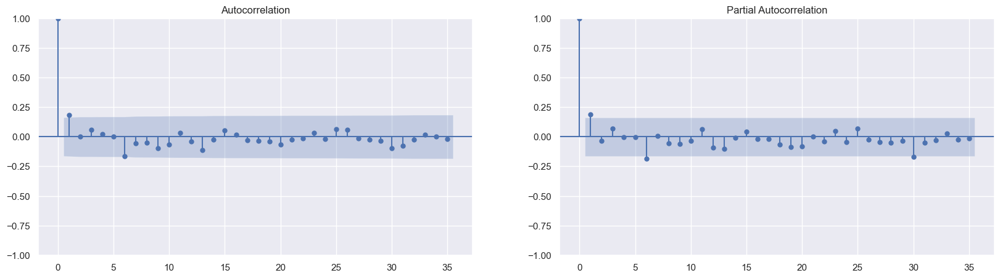

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pyspark.sql import SparkSession
from pyspark.sql.functions import to_date

average_sales_per_week_df = average_sales_per_week.toPandas()
average_sales_per_week_df['Date'] = pd.to_datetime(pandas_df['Date'])
average_sales_per_week_df.set_index('Date', inplace=True)

max_lags = 35

fig, axes = plt.subplots(1, 2, figsize=(20, 5))

plot_acf(average_sales_per_week_df, lags=max_lags, ax=axes[0])

plot_pacf(average_sales_per_week_df, lags=max_lags, ax=axes[1])

plt.show()

#### Weekly Sales - Holiday

In [20]:
average_sales_per_week_n = retail_df.groupBy('Date', 'IsHoliday').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))
average_sales_per_week_n = average_sales_per_week_n.orderBy('Date')
average_sales_per_week_n.show()

+----------+---------+--------------------+
|      Date|IsHoliday|  Total_Weekly_Sales|
+----------+---------+--------------------+
|2010-01-10|    false| 4.223987586999992E7|
|2010-02-04|    false|5.0423831260000035E7|
|2010-02-07|    false| 4.891748450000017E7|
|2010-02-19|    false| 4.827699378000006E7|
|2010-02-26|    false| 4.396857112999993E7|
|2010-03-09|    false| 4.719425760999999E7|
|2010-03-12|    false| 4.990902788000007E7|
|2010-03-19|    false| 4.498897464000006E7|
|2010-03-26|    false|4.4133961050000034E7|
|2010-04-06|    false|5.0188543119999915E7|
|2010-04-16|    false|4.5183667080000006E7|
|2010-04-23|    false| 4.473445256000002E7|
|2010-04-30|    false|4.3705126709999874E7|
|2010-05-02|    false| 4.975074049999988E7|
|2010-05-03|    false|        4.68714703E7|
|2010-05-11|    false|       4.578198189E7|
|2010-05-14|    false|4.5330080199999996E7|
|2010-05-21|    false| 4.512010805999994E7|
|2010-05-28|    false| 4.775750256000001E7|
|2010-06-08|    false| 4.8204999

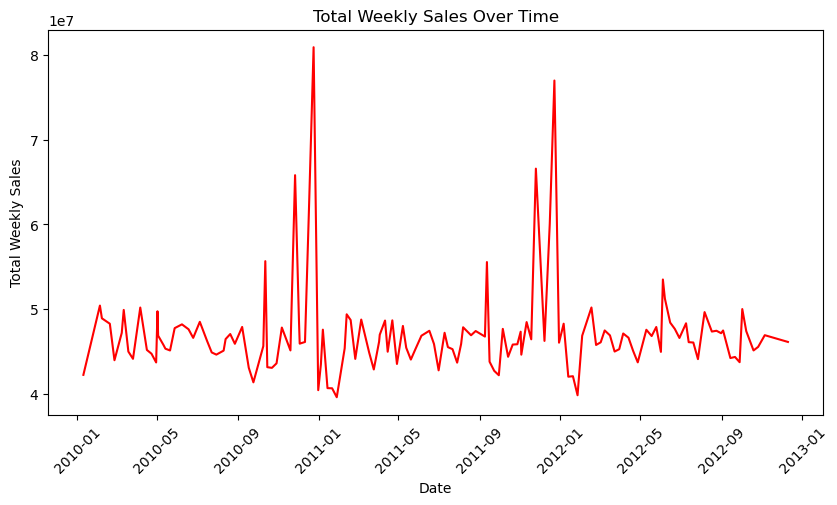

In [72]:
average_sales_per_week_df = average_sales_per_week.toPandas()

# Create the line plot
plt.figure(figsize=(10, 5))
plt.plot(average_sales_per_week_df['Date'], average_sales_per_week_df['Total_Weekly_Sales'],color='red')
plt.xlabel('Date')
plt.ylabel('Total Weekly Sales')
plt.title('Total Weekly Sales Over Time')
plt.xticks(rotation=45)
plt.show()

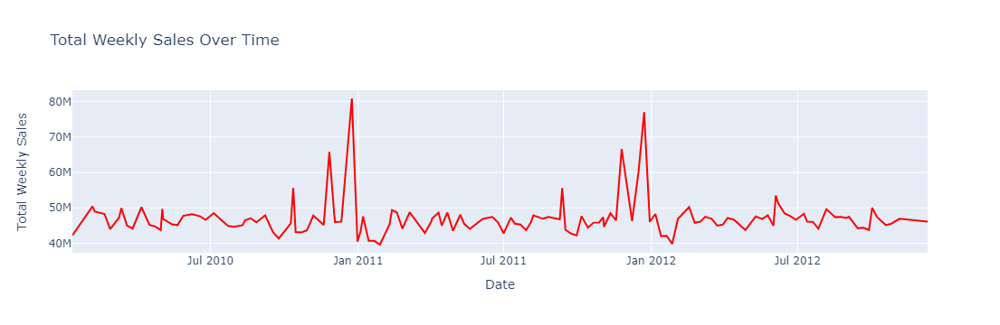

In [75]:
import plotly.graph_objects as go
import pandas as pd

average_sales_per_week_df = average_sales_per_week.toPandas()

fig = go.Figure()

# Create the line plot with the specified color
fig.add_trace(go.Scatter(
    x=average_sales_per_week_df['Date'],
    y=average_sales_per_week_df['Total_Weekly_Sales'],
    mode='lines',
    line=dict(color='red'),  # Set the line color to 'red'
    name='Total Weekly Sales'
))

# Customize the layout
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Total Weekly Sales',
    title='Total Weekly Sales Over Time',
)

fig.show()


<Axes: xlabel='Date', ylabel='Total_Weekly_Sales'>

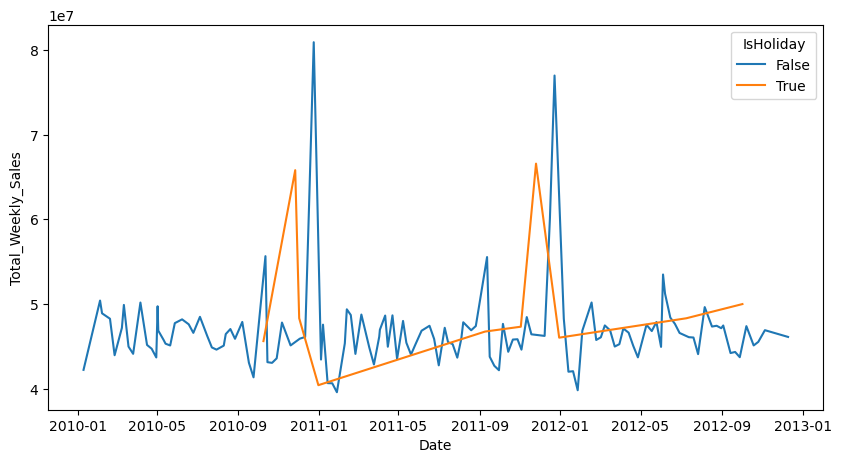

In [76]:
average_sales_per_week_n_df = average_sales_per_week_n.toPandas()

plt.figure(figsize=(10,5))
sns.lineplot(data=average_sales_per_week_n_df, x="Date", y='Total_Weekly_Sales', hue="IsHoliday")

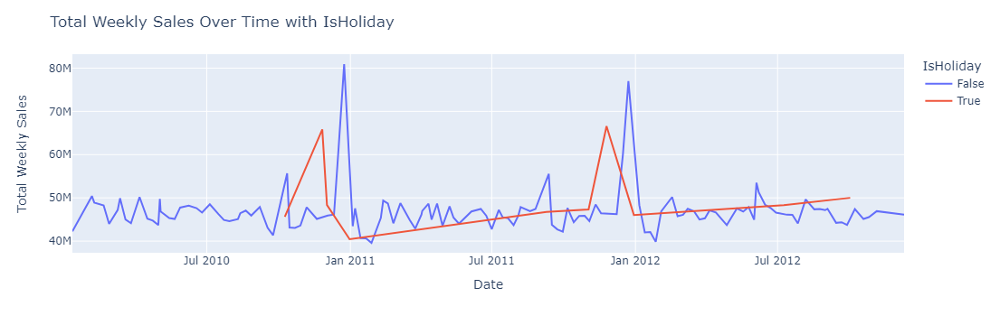

In [79]:
import plotly.express as px
import pandas as pd

average_sales_per_week_n_df = average_sales_per_week_n.toPandas()

fig = px.line(average_sales_per_week_n_df, x="Date", y="Total_Weekly_Sales", color="IsHoliday")

# Customize the layout
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Total Weekly Sales',
    title='Total Weekly Sales Over Time with IsHoliday',
)

fig.show()

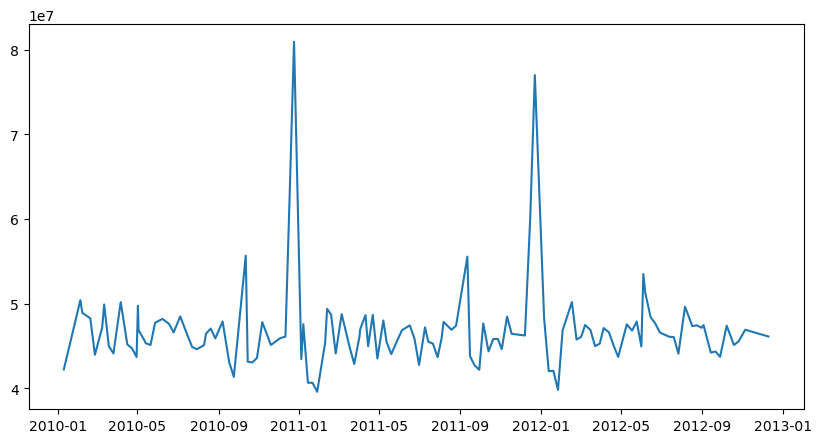

In [80]:
plt.figure(figsize=(10,5))
plt.plot(average_sales_per_week_n_df[(average_sales_per_week_n_df.IsHoliday==False)]['Date'], average_sales_per_week_n_df[(average_sales_per_week_n_df.IsHoliday==False)]['Total_Weekly_Sales'])
plt.show()

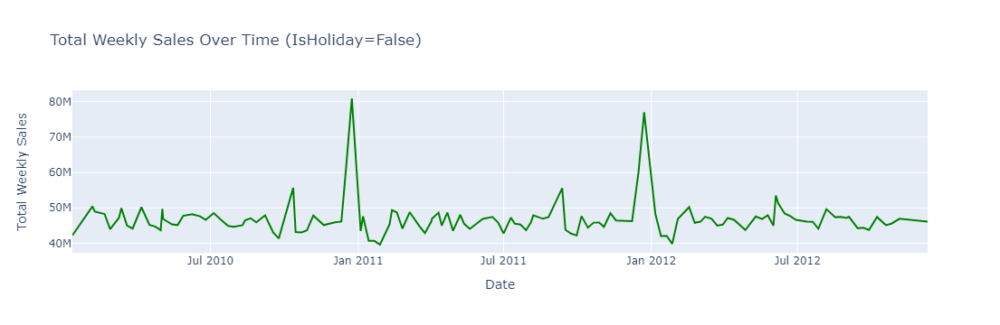

In [86]:
import plotly.express as px
import pandas as pd

average_sales_per_week_n_df = average_sales_per_week_n.toPandas()

fig = px.line(
    average_sales_per_week_n_df[average_sales_per_week_n_df['IsHoliday'] == False],
    x='Date',
    y='Total_Weekly_Sales',
    title='Total Weekly Sales Over Time (IsHoliday=False)',color_discrete_sequence=['green']
)

# Customize the layout
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Total Weekly Sales',
)

fig.show()


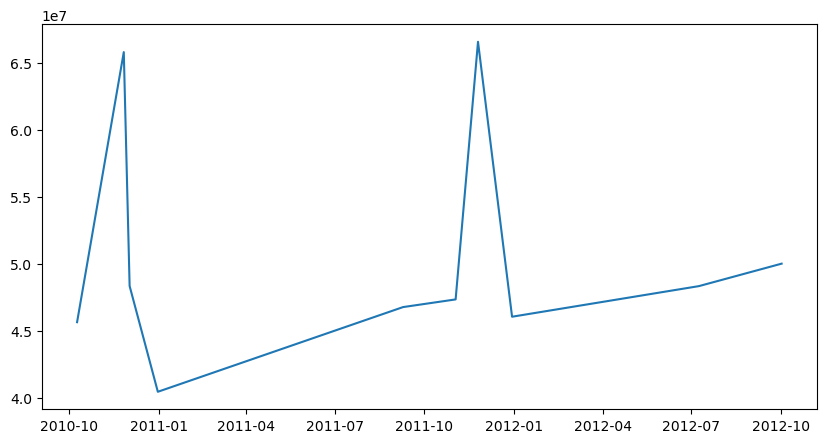

In [87]:
plt.figure(figsize=(10,5))
plt.plot(average_sales_per_week_n_df[(average_sales_per_week_n_df.IsHoliday==True)]['Date'], average_sales_per_week_n_df[(average_sales_per_week_n_df.IsHoliday==True)]['Total_Weekly_Sales'])
plt.show()

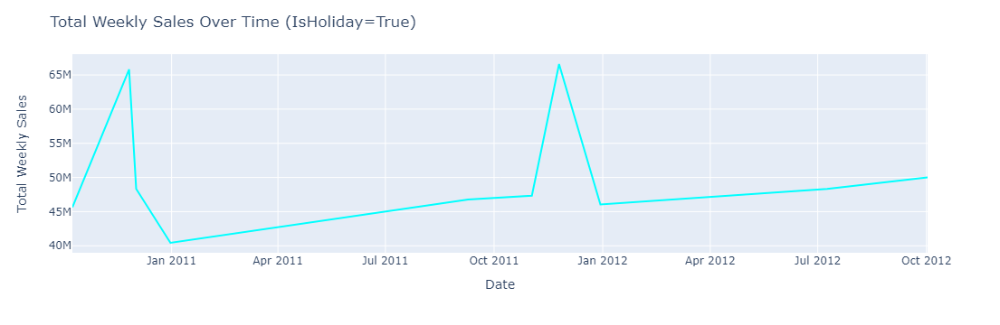

In [89]:
import plotly.express as px
import pandas as pd

average_sales_per_week_n_df = average_sales_per_week_n.toPandas()

fig = px.line(
    average_sales_per_week_n_df[average_sales_per_week_n_df['IsHoliday'] == True],
    x='Date',
    y='Total_Weekly_Sales',
    line_shape='linear',  # Set the line shape
    color_discrete_sequence=['cyan']  # Set the line color to green
)

# Customize the layout
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Total Weekly Sales',
    title='Total Weekly Sales Over Time (IsHoliday=True)',
)

fig.show()


#### Month and yearwise Sales

In [26]:
from pyspark.sql.functions import year, month
import pyspark.sql.functions as F

average_sales_per_date = retail_df.select("Date", "Weekly_Sales")

average_sales_per_date = average_sales_per_date.withColumn("Month", month("Date")).withColumn("Year", year("Date"))

average_sales_per_date.show()

+----------+------------+-----+----+
|      Date|Weekly_Sales|Month|Year|
+----------+------------+-----+----+
|2010-05-02|     24924.5|    5|2010|
|2010-05-02|    50605.27|    5|2010|
|2010-05-02|    13740.12|    5|2010|
|2010-05-02|    39954.04|    5|2010|
|2010-05-02|    32229.38|    5|2010|
|2010-05-02|     5749.03|    5|2010|
|2010-05-02|    21084.08|    5|2010|
|2010-05-02|    40129.01|    5|2010|
|2010-05-02|    16930.99|    5|2010|
|2010-05-02|     30721.5|    5|2010|
|2010-05-02|    24213.18|    5|2010|
|2010-05-02|     8449.54|    5|2010|
|2010-05-02|    41969.29|    5|2010|
|2010-05-02|    19466.91|    5|2010|
|2010-05-02|    10217.55|    5|2010|
|2010-05-02|    13223.76|    5|2010|
|2010-05-02|      4729.5|    5|2010|
|2010-05-02|     1947.05|    5|2010|
|2010-05-02|      5034.1|    5|2010|
|2010-05-02|     8907.63|    5|2010|
+----------+------------+-----+----+
only showing top 20 rows



In [27]:
average_sales_per_month = average_sales_per_date.groupBy(month("Date").alias("Month")).agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))
average_sales_per_month = average_sales_per_month.orderBy('Month')
average_sales_per_month.show()

+-----+--------------------+
|Month|  Total_Weekly_Sales|
+-----+--------------------+
|    1|4.2642626504999876E8|
|    2| 5.220256828899991E8|
|    3| 5.534864095700002E8|
|    4| 6.453238896199996E8|
|    5| 6.056965921900002E8|
|    6|      5.7501796377E8|
|    7| 5.933139371799991E8|
|    8|      5.6423169951E8|
|    9| 5.905322628499982E8|
|   10| 6.029188574200001E8|
|   11| 4.591693358899994E8|
|   12| 5.990760911699991E8|
+-----+--------------------+



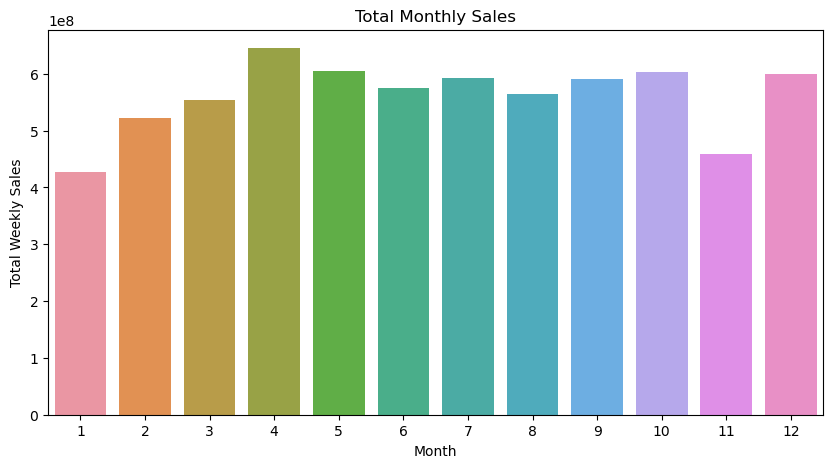

In [29]:
average_sales_per_month_df = average_sales_per_month.toPandas()

plt.figure(figsize=(10, 5))
sns.barplot(x='Month', y='Total_Weekly_Sales', data=average_sales_per_month_df)
plt.xlabel('Month')
plt.ylabel('Total Weekly Sales')
plt.title('Total Monthly Sales')
plt.show()

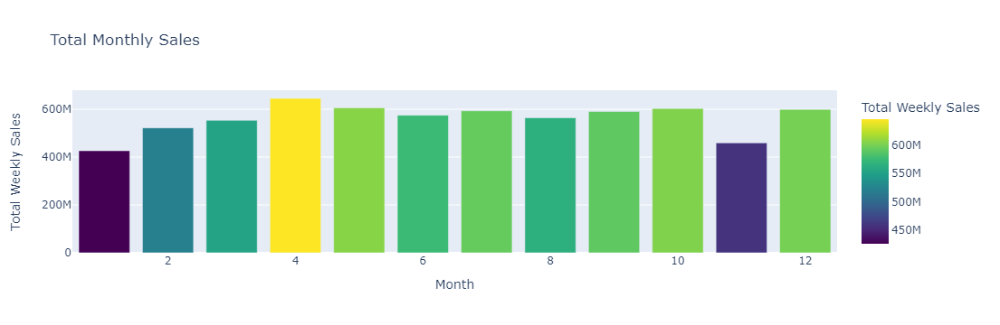

In [31]:
import plotly.express as px

# Define a custom color scale using a colormap (e.g., 'viridis')
custom_color_scale = px.colors.sequential.Viridis

fig = px.bar(
    average_sales_per_month_df,
    x='Month',
    y='Total_Weekly_Sales',
    labels={'Month': 'Month', 'Total_Weekly_Sales': 'Total Weekly Sales'},
    title='Total Monthly Sales',
    color='Total_Weekly_Sales',  # Assign color based on Total_Weekly_Sales
    color_continuous_scale=custom_color_scale  # Use the custom color scale
)

fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Total Weekly Sales',
    xaxis=dict(categoryorder='array', categoryarray=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
)

fig.show()


In [32]:
average_sales_per_year = average_sales_per_date.groupBy(year("Date").alias("Year")).agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))

average_sales_per_year.show()

+----+-------------------+
|Year| Total_Weekly_Sales|
+----+-------------------+
|2010|2.288886120410014E9|
|2011|2.448200007350013E9|
|2012|2.000132859349991E9|
+----+-------------------+



<Axes: xlabel='Year', ylabel='Total_Weekly_Sales'>

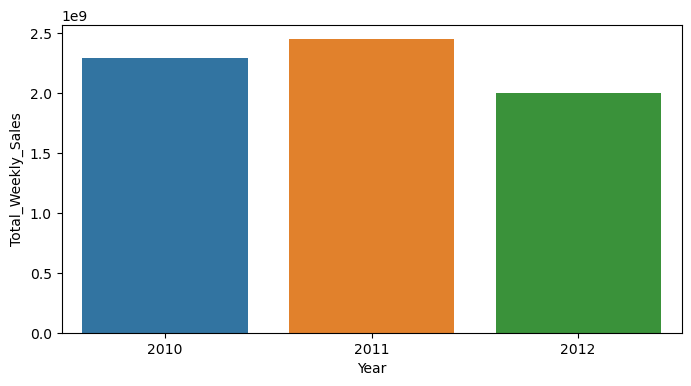

In [137]:
average_sales_per_year_df = average_sales_per_year.toPandas()

plt.figure(figsize=(8,4))
sns.barplot(x=average_sales_per_year_df.Year, y=average_sales_per_year_df.Total_Weekly_Sales)

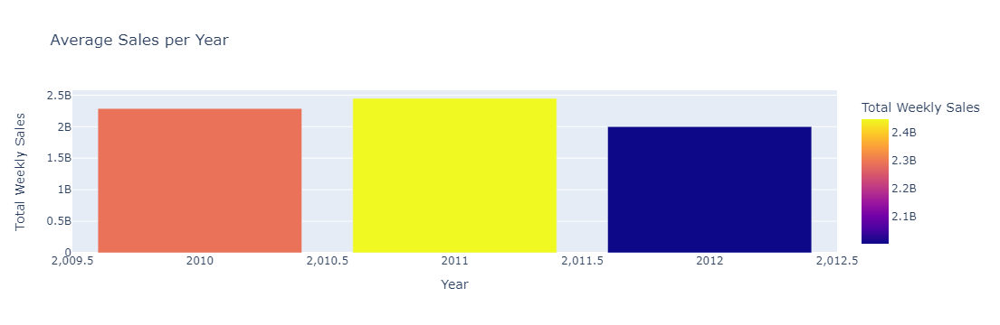

In [33]:
import plotly.express as px

average_sales_per_year_df = average_sales_per_year.toPandas()

# Define a color scale
color_scale = px.colors.sequential.Plasma  # You can choose a different color scale

fig = px.bar(
    average_sales_per_year_df,
    x='Year',
    y='Total_Weekly_Sales',
    labels={'Year': 'Year', 'Total_Weekly_Sales': 'Total Weekly Sales'},
    title='Average Sales per Year',
    color='Total_Weekly_Sales',  # Assign color based on Total_Weekly_Sales
    color_continuous_scale=color_scale  # Use the custom color scale
)

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Total Weekly Sales'
)

fig.show()


#### StoreWise Sales

In [31]:
from pyspark.sql.types import DoubleType

retail_df = retail_df.withColumn("Weekly_Sales", retail_df["Weekly_Sales"].cast(DoubleType()))

# Group by 'Store' and calculate the sum of 'Weekly_Sales' per store
top_stores = retail_df.groupBy('Store').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))

# Sort the result in descending order
top_stores = top_stores.orderBy('Total_Weekly_Sales', ascending=False)

# Show the top 3 stores
top_stores.show(5)

+-----+--------------------+
|Store|  Total_Weekly_Sales|
+-----+--------------------+
|   20| 3.013977924599998E8|
|    4|2.9954395338000005E8|
|   14| 2.889999113400001E8|
|   13|2.8651770379999995E8|
|    2| 2.753824409800001E8|
+-----+--------------------+
only showing top 5 rows



C:\Users\VENKA\AppData\Local\Temp\ipykernel_14664\2758848540.py:22: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, pad=0.01)


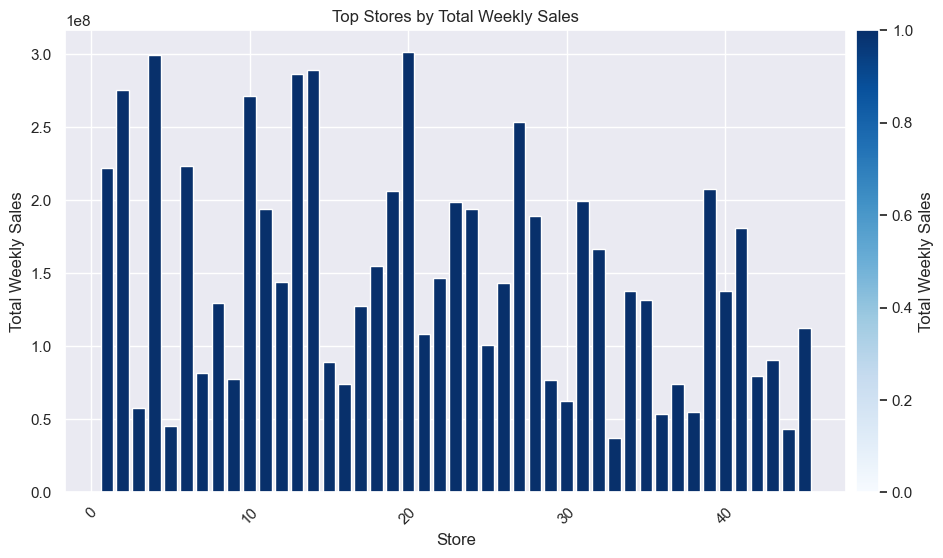

In [42]:
top_stores_df = top_stores.toPandas()

top_stores_df = top_stores_df.sort_values(by='Total_Weekly_Sales', ascending=False)

# Extract 'Store' and 'Total_Weekly_Sales' columns
stores = top_stores_df['Store']
total_sales = top_stores_df['Total_Weekly_Sales']

cmap = sns.color_palette("Blues", as_cmap=True)

# Create a bar plot with a custom colormap
plt.figure(figsize=(12, 6))
plt.bar(stores, total_sales, color=cmap(total_sales))
plt.xlabel('Store')
plt.ylabel('Total Weekly Sales')
plt.title('Top Stores by Total Weekly Sales')
plt.xticks(rotation=45)

# Add a colorbar to indicate the values
sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, pad=0.01)
cbar.set_label('Total Weekly Sales', rotation=90)

plt.show()

#### Types - Weekly sales

In [34]:
from pyspark.sql.functions import min, max

date_range = retail_df.agg(min("Date").alias("Min_Date"), max("Date").alias("Max_Date")).collect()

min_date = date_range[0]["Min_Date"]
max_date = date_range[0]["Max_Date"]

print("The data is from {} till {}".format(min_date, max_date))

The data is from 2010-01-10 till 2012-12-10


In [35]:
from pyspark.sql.functions import sum

sales_per_store_type = retail_df.groupBy('Type').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))
sales_per_store_type = sales_per_store_type.orderBy("Type")
sales_per_store_type.show()

+----+--------------------+
|Type|  Total_Weekly_Sales|
+----+--------------------+
|   A| 4.331014722750007E9|
|   B| 2.000700736819999E9|
|   C|4.0550352754000014E8|
+----+--------------------+



In [36]:
sales_per_store_type_n = retail_df.groupBy('Date', 'Type').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))
sales_per_store_type_n = sales_per_store_type_n.orderBy('Date')
sales_per_store_type_n.show()

+----------+----+--------------------+
|      Date|Type|  Total_Weekly_Sales|
+----------+----+--------------------+
|2010-01-10|   A|2.7265424160000056E7|
|2010-01-10|   B|1.2200056749999994E7|
|2010-01-10|   C|  2774394.9600000004|
|2010-02-04|   A| 3.231494992000004E7|
|2010-02-04|   C|  2809211.0200000005|
|2010-02-04|   B|1.5299670320000011E7|
|2010-02-07|   C|  2784962.2600000002|
|2010-02-07|   A| 3.123864047999999E7|
|2010-02-07|   B|1.4893881760000013E7|
|2010-02-19|   B|1.4540038620000012E7|
|2010-02-19|   C|  2736882.3999999976|
|2010-02-19|   A|       3.100007276E7|
|2010-02-26|   A|2.8008995990000006E7|
|2010-02-26|   B|1.3256113439999988E7|
|2010-02-26|   C|           2703461.7|
|2010-03-09|   A|3.0345468920000006E7|
|2010-03-09|   B|       1.398985054E7|
|2010-03-09|   C|          2858938.15|
|2010-03-12|   A| 3.157629924999995E7|
|2010-03-12|   C|  2589259.2600000007|
+----------+----+--------------------+
only showing top 20 rows



<Axes: xlabel='Date', ylabel='Total_Weekly_Sales'>

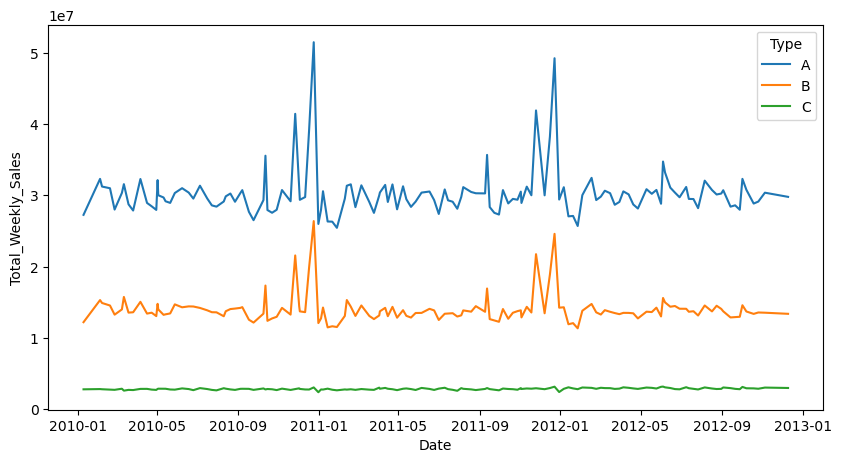

In [37]:
sales_per_store_type_n_df = sales_per_store_type_n.toPandas()
plt.figure(figsize=(10,5))
sns.lineplot(data=sales_per_store_type_n_df, x="Date", y="Total_Weekly_Sales", hue="Type")

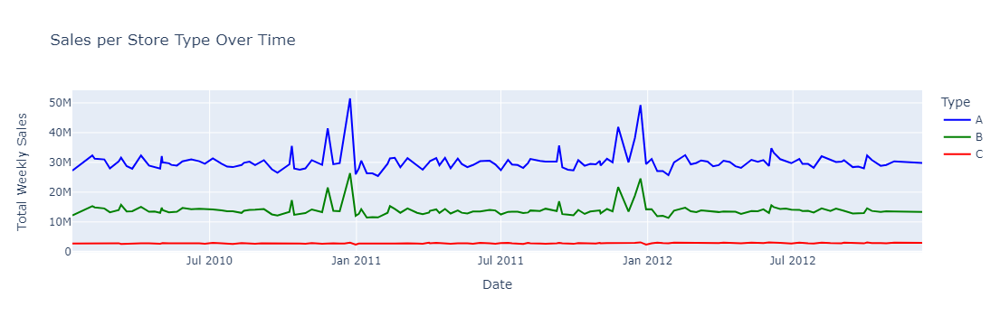

In [38]:
import plotly.express as px

sales_per_store_type_n_df = sales_per_store_type_n.toPandas()

# Define a colormap
cmap = ['blue', 'green', 'red', 'purple']  # You can customize this colormap

fig = px.line(
    sales_per_store_type_n_df,
    x='Date',
    y='Total_Weekly_Sales',
    color='Type',
    labels={'Date': 'Date', 'Total_Weekly_Sales': 'Total Weekly Sales'},
    title='Sales per Store Type Over Time',
)

# Manually specify colors based on the colormap
for i, type in enumerate(sales_per_store_type_n_df['Type'].unique()):
    fig.data[i].line.color = cmap[i]

fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Total Weekly Sales'
)

fig.show()


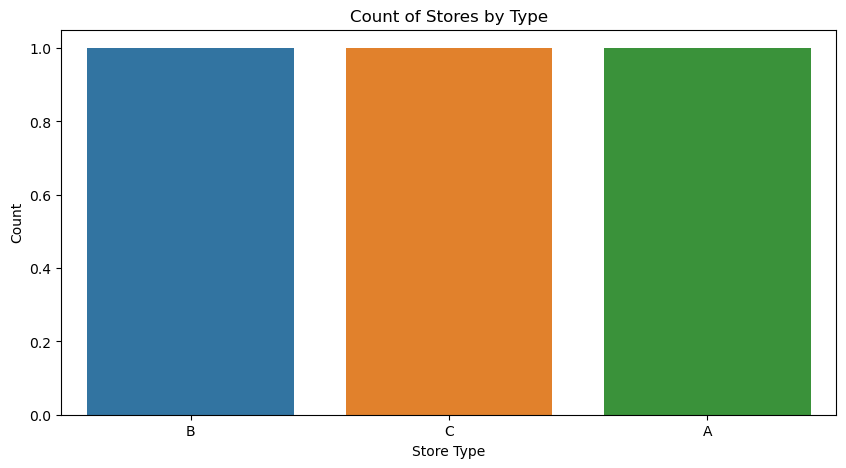

In [39]:
type_df = retail_df.groupBy('Type').count().toPandas()

plt.figure(figsize=(10, 5))
sns.countplot(x='Type', data=type_df)
plt.xlabel('Store Type')
plt.ylabel('Count')
plt.title('Count of Stores by Type')
plt.show()

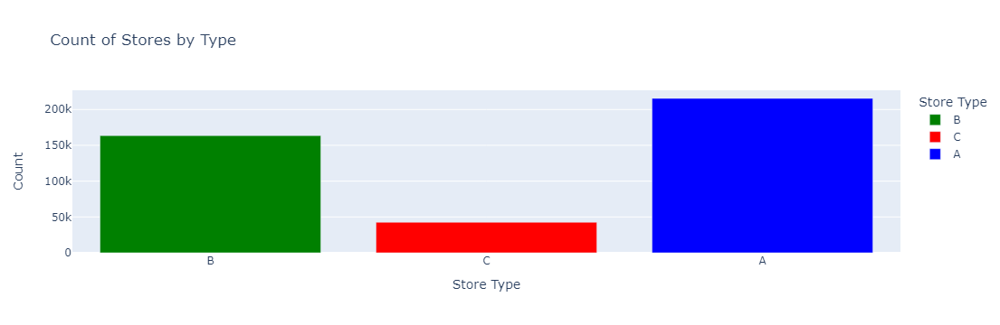

In [41]:
import plotly.express as px

type_df = retail_df.groupBy('Type').count().toPandas()

# Define a dictionary to map store types to colors
color_map = {
    'A': 'blue',
    'B': 'green',
    'C': 'red',
}

type_df['Color'] = type_df['Type'].map(color_map)

fig = px.bar(
    type_df,
    x='Type',
    y='count',
    color='Type',  # This attribute is used for the legend
    labels={'Type': 'Store Type', 'count': 'Count'},
    title='Count of Stores by Type',
    color_discrete_map=color_map  # Assign colors using the defined dictionary
)

fig.update_layout(
    xaxis_title='Store Type',
    yaxis_title='Count'
)

fig.show()


<Axes: xlabel='Type', ylabel='Weekly_Sales'>

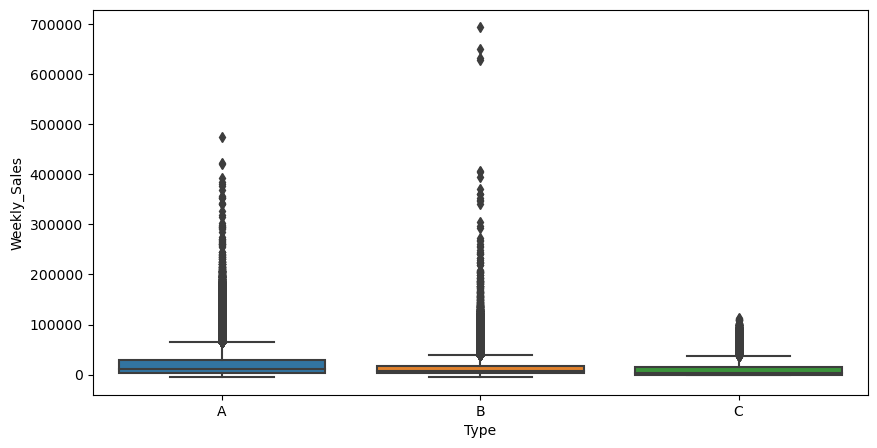

In [42]:
type_df = retail_df.groupBy('Type',"Weekly_Sales").count().toPandas()

plt.figure(figsize=(10,5))

sns.boxplot(data = type_df,y="Weekly_Sales",x="Type")

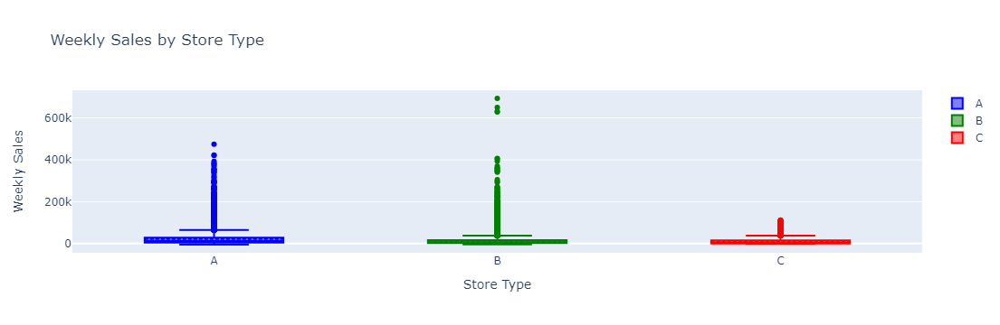

In [44]:
import plotly.graph_objects as go

type_df = retail_df.groupBy('Type', 'Weekly_Sales').count().toPandas()

# Define a colormap
cmap = {'A': 'blue', 'B': 'green', 'C': 'red'}

fig = go.Figure()

for store_type, data in type_df.groupby('Type'):
    fig.add_trace(go.Box(
        y=data['Weekly_Sales'],
        name=store_type,
        boxmean=True,
        marker=dict(color=cmap[store_type]),
    ))

fig.update_layout(
    xaxis_title='Store Type',
    yaxis_title='Weekly Sales',
    title='Weekly Sales by Store Type'
)

fig.show()


<Axes: xlabel='Type', ylabel='Size'>

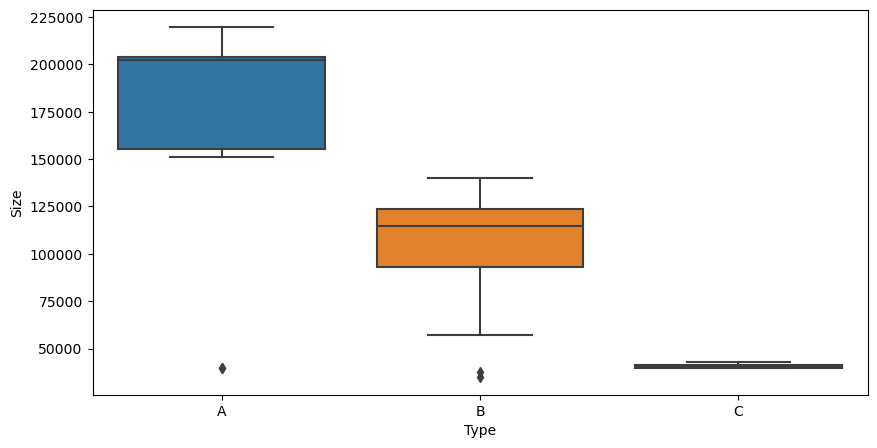

In [47]:
size_df = retail_df.groupBy('Type',"Size").count().toPandas()

plt.figure(figsize=(10,5))

sns.boxplot(data = size_df,y="Size",x="Type")

#### DEPT WISE SALES

In [48]:
sales_by_dept = retail_df.groupBy('Dept').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))
sales_by_dept = sales_by_dept.orderBy('Dept')
sales_by_dept.show()

+----+--------------------+
|Dept|  Total_Weekly_Sales|
+----+--------------------+
|   1|      1.2363877654E8|
|   2| 2.806111744299999E8|
|   3| 7.589244994999999E7|
|   4|      1.6714674558E8|
|   5|1.3560735856999996E8|
|   6| 2.842066713999999E7|
|   7|      1.5547756275E8|
|   8|1.9428078073000002E8|
|   9|1.2839325664999996E8|
|  10|      1.1789738758E8|
|  11| 9.332927638000003E7|
|  12|       2.676011951E7|
|  13|1.9732156995000005E8|
|  14| 9.569466644999996E7|
|  16| 9.167068227000003E7|
|  17|6.5319816629999995E7|
|  18| 3.689748906000001E7|
|  19|  6816183.1099999985|
|  20| 3.334964510999999E7|
|  21|3.2064645080000002E7|
+----+--------------------+
only showing top 20 rows



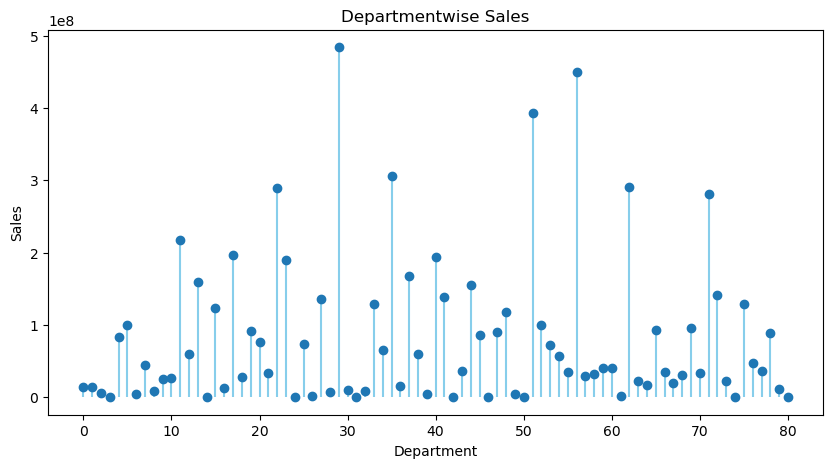

In [59]:
sales_by_dept = retail_df.groupBy('Dept').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))

pandas_df = sales_by_dept.toPandas()

fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.vlines(x=pandas_df.index, ymin=0, ymax=pandas_df['Total_Weekly_Sales'], color='skyblue')
ax1.plot(pandas_df.index, pandas_df['Total_Weekly_Sales'], "o")
plt.title("Departmentwise Sales")
plt.ylabel("Sales")
plt.xlabel("Department")
plt.show()


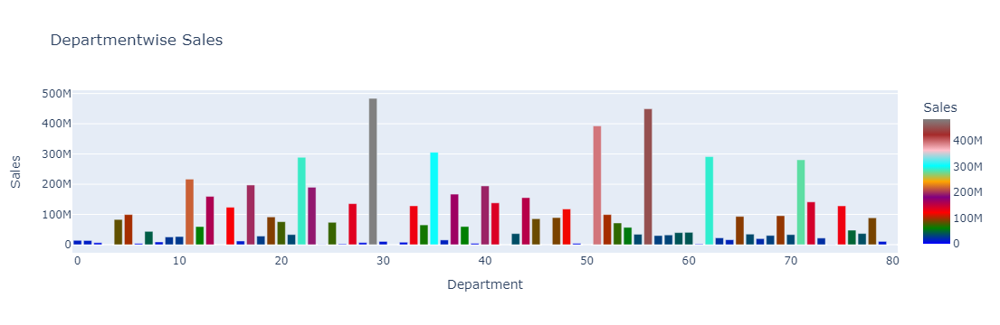

In [51]:
import plotly.express as px

sales_by_dept = retail_df.groupBy('Dept').agg(sum('Weekly_Sales').alias('Total_Weekly_Sales'))
pandas_df = sales_by_dept.toPandas()

# Define a colormap
cmap = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'pink', 'brown', 'gray']

fig = px.bar(
    pandas_df,
    x=pandas_df.index,
    y='Total_Weekly_Sales',
    color='Total_Weekly_Sales',
    labels={'x': 'Department', 'Total_Weekly_Sales': 'Sales'},
    title='Departmentwise Sales',
    color_continuous_scale=cmap  # Assign colors using the defined colormap
)

fig.update_layout(
    xaxis_title='Department',
    yaxis_title='Sales'
)

fig.show()


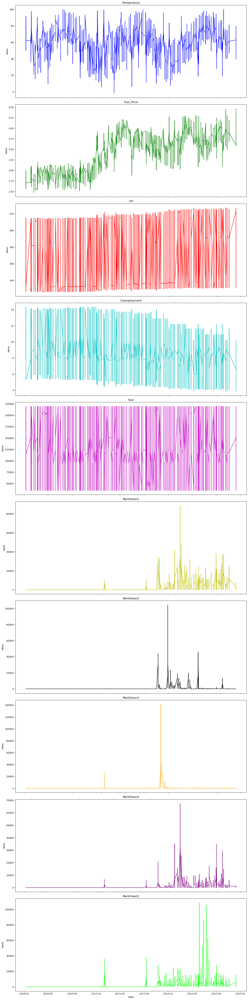

In [19]:
from pyspark.sql.functions import to_date, col

pandas_data = retail_df.select('Date', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'Size', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5') \
    .withColumn('Date', to_date(col('Date'))) \
    .toPandas()

# Set 'Date' column as the index
pandas_data.set_index('Date', inplace=True)

# Create subplots
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'orange', 'purple', 'lime']

# Create subplots
fig, axes = plt.subplots(len(pandas_data.columns), 1, figsize=(15, 60), sharex=True)

# Plot each column on separate subplots with different colors
for i, (col, color) in enumerate(zip(pandas_data.columns, colors)):
    pandas_data[col].plot(ax=axes[i], color=color)
    axes[i].set_title(col)
    axes[i].set_ylabel("Value")

plt.xlabel('Date')
plt.tight_layout()
plt.show()

In [17]:
pandas_data

,Temperature,Fuel_Price,CPI,Unemployment,Size,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5
Date,,,,,,,,,,
2010-05-02,42.31,2.572,211.096358,8.106,151315,0.00,0.00,0.0,0.00,0.00
2010-05-02,42.31,2.572,211.096358,8.106,151315,0.00,0.00,0.0,0.00,0.00
2010-05-02,42.31,2.572,211.096358,8.106,151315,0.00,0.00,0.0,0.00,0.00
2010-05-02,42.31,2.572,211.096358,8.106,151315,0.00,0.00,0.0,0.00,0.00
2010-05-02,42.31,2.572,211.096358,8.106,151315,0.00,0.00,0.0,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...
2012-10-26,58.85,3.882,192.308899,8.667,118221,4018.91,58.08,100.0,211.94,858.33
2012-10-26,58.85,3.882,192.308899,8.667,118221,4018.91,58.08,100.0,211.94,858.33
2012-10-26,58.85,3.882,192.308899,8.667,118221,4018.91,58.08,100.0,211.94,858.33


C:\Users\VENKA\AppData\Local\Temp\ipykernel_14664\3872475081.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = pandas_df.corr()


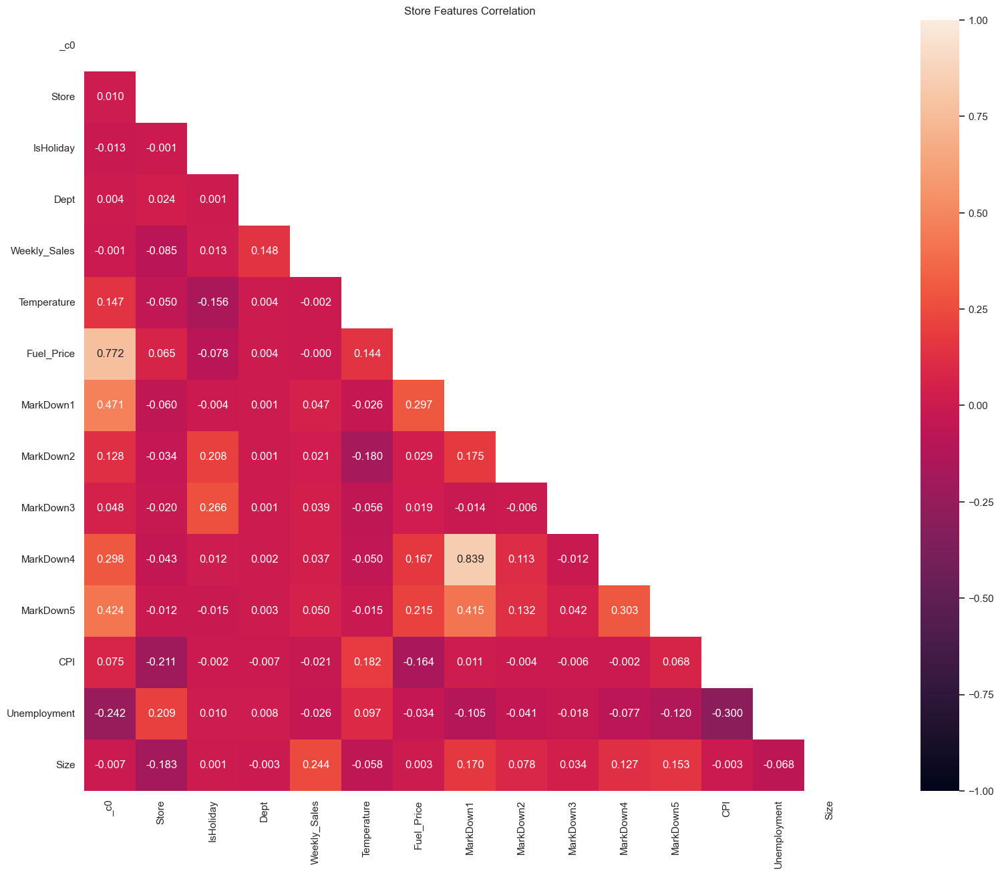

In [24]:
pandas_df = retail_df.toPandas()
correlation_matrix = pandas_df.corr()

# Create a mask to hide the upper triangle of the heatmap
mask = np.zeros_like(correlation_matrix)
mask[np.triu_indices_from(mask)] = True

# Set the font scale and create the heatmap
sns.set(font_scale=1)
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(25, 15))
    plt.title('Store Features Correlation')
    ax = sns.heatmap(correlation_matrix, mask=mask, vmax=1, vmin=-1, square=True, annot=True, fmt=".3f",
                    xticklabels=correlation_matrix.columns.values, yticklabels=correlation_matrix.columns.values)

plt.show()

In [90]:
from statsmodels.tsa.seasonal import seasonal_decompose
season_df = retail_df.toPandas()
decomposition = seasonal_decompose(season_df["Weekly_Sales"], period=45) 

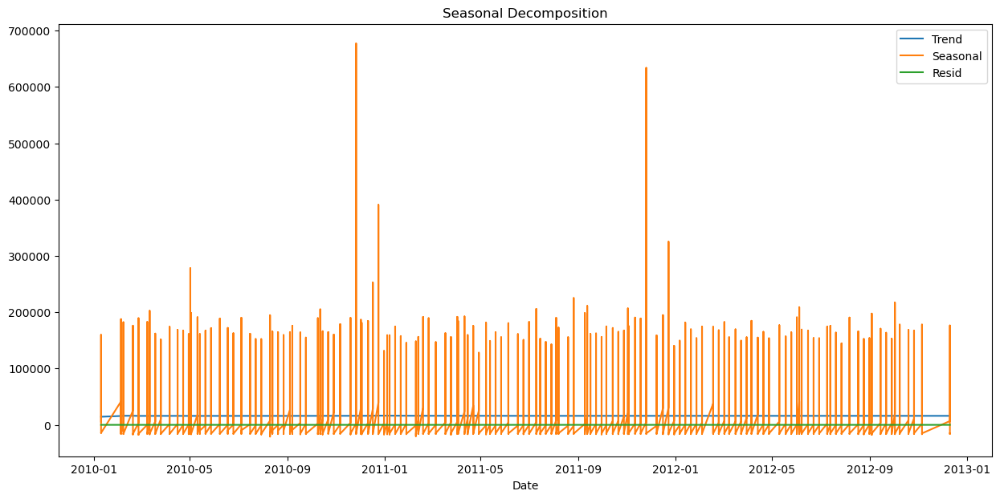

In [92]:
from pyspark.sql import SparkSession
from pyspark.sql.window import Window
from pyspark.sql import functions as F
import matplotlib.pyplot as plt

# Assuming you already have a SparkSession and your 'retail_df' DataFrame

# Define the window specification for sorting the data by date
window_spec = Window.orderBy(F.col('Date'))

# Calculate the rolling mean as the trend
season_df = retail_df.withColumn("Trend", F.avg("Weekly_Sales").over(window_spec))

# Calculate the seasonal component
season_df = season_df.withColumn("Seasonal", season_df["Weekly_Sales"] - season_df["Trend"])

# Calculate the residual component
season_df = season_df.withColumn("Resid", season_df["Weekly_Sales"] - season_df["Trend"] - season_df["Seasonal"])

# Convert the DataFrame to Pandas for visualization
season_df_pandas = season_df.select("Date", "Trend", "Seasonal", "Resid").toPandas()

# Create the plot
plt.figure(figsize=(15, 7))
plt.plot(season_df_pandas["Date"], season_df_pandas["Trend"])
plt.plot(season_df_pandas["Date"], season_df_pandas["Seasonal"])
plt.plot(season_df_pandas["Date"], season_df_pandas["Resid"])
plt.legend(["Trend", "Seasonal", "Resid"], loc="upper right")
plt.xlabel("Date")
plt.title("Seasonal Decomposition")
plt.show()

In [105]:
# Assuming you have a PySpark DataFrame 'original_df'
copied_df = retail_df.alias("copied_df")

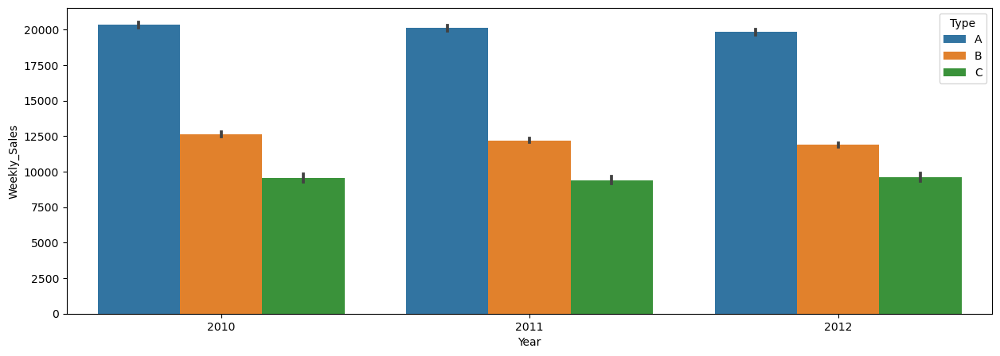

In [113]:
data_train = retail_df.filter(col("Weekly_Sales").isNotNull())
data_test = retail_df.filter(col("Weekly_Sales").isNull())

# Extract the year from the 'Date' column
data_train = data_train.withColumn("Year", year(data_train.Date))

# Create a barplot using PySpark DataFrame
data_train_pd = data_train.toPandas()  # Convert to Pandas DataFrame for plotting

plt.figure(figsize=(15, 5))
sns.barplot(data=data_train_pd, x='Year', y='Weekly_Sales', hue='Type')

plt.show()

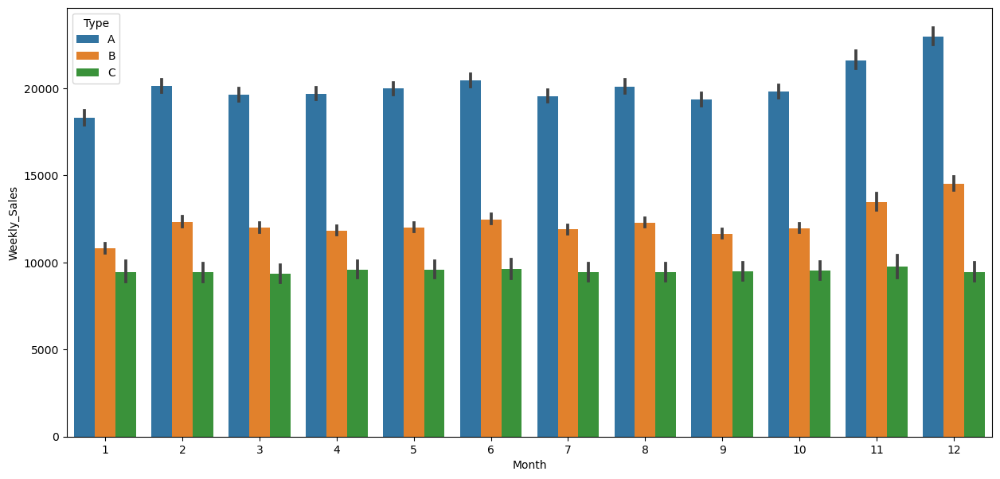

In [117]:
data_train = retail_df.filter(col("Weekly_Sales").isNotNull())

# Extract the month from the 'Date' column
data_train = data_train.withColumn("Month", month(data_train.Date))

# Create a barplot using PySpark DataFrame
data_train_pd = data_train.toPandas()  # Convert to Pandas DataFrame for plotting

plt.figure(figsize=(15, 7))
sns.barplot(data=data_train_pd, x='Month', y='Weekly_Sales', hue='Type')

plt.show()

In [121]:
mar_df = retail_df.toPandas()

Text(0.5, 0, 'Date')

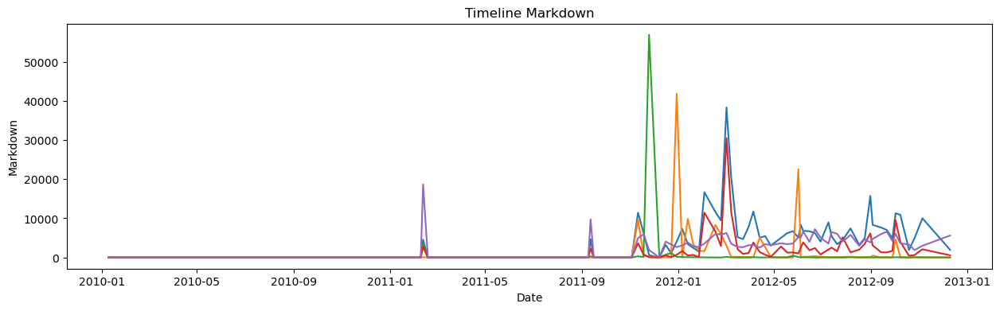

In [122]:
plt.figure(figsize=(15,4))
train_markdown = mar_df[mar_df.MarkDown2.notnull()]
train_markdown = train_markdown.groupby("Date").agg({"MarkDown1":"mean","MarkDown2":"mean","MarkDown3":"mean","MarkDown4":"mean","MarkDown5":"mean"})


plt.plot(train_markdown.index,train_markdown.MarkDown1)
plt.plot(train_markdown.index,train_markdown.MarkDown2)
plt.plot(train_markdown.index,train_markdown.MarkDown3)
plt.plot(train_markdown.index,train_markdown.MarkDown4)
plt.plot(train_markdown.index,train_markdown.MarkDown5)
plt.title("Timeline Markdown")
plt.ylabel("Markdown")
plt.xlabel("Date")

Text(0, 0.5, 'Markdown')

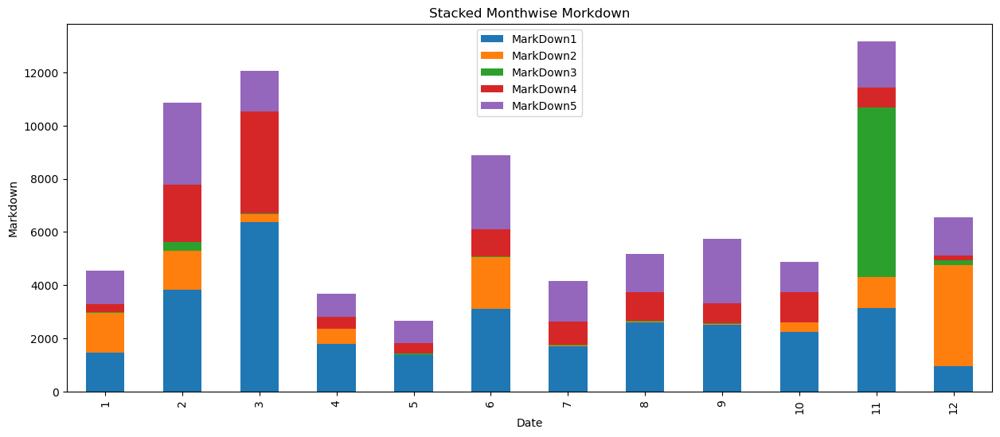

In [125]:
train_markdown.index = pd.to_datetime(train_markdown.index)

train_markdown_month = train_markdown.groupby(train_markdown.index.month).agg({"MarkDown1":"mean","MarkDown2":"mean","MarkDown3":"mean","MarkDown4":"mean","MarkDown5":"mean"})

train_markdown_month.plot(kind='bar', stacked=True,figsize=(15,6))
plt.title("Stacked Monthwise Morkdown")
plt.ylabel("Markdown")

Text(0, 0.5, 'Markdown')

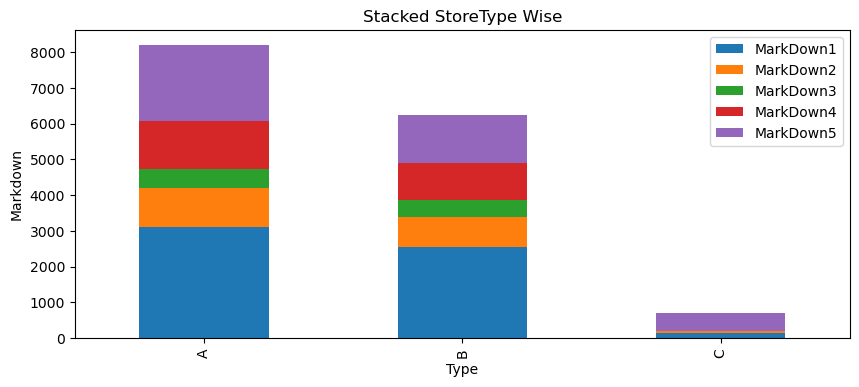

In [126]:
train_markdown_1 = mar_df[mar_df.MarkDown2.notnull()]
train_markdown_type = train_markdown_1.groupby("Type").agg({"MarkDown1":"mean","MarkDown2":"mean","MarkDown3":"mean","MarkDown4":"mean","MarkDown5":"mean"})

train_markdown_type.plot(kind='bar', stacked=True,figsize=(10,4))
plt.title("Stacked StoreType Wise")
plt.ylabel("Markdown")